In [13]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sys
import os

In [43]:
def processPBSim(basePath, baseFolder, baseName, pltInputPower, extDataList, xL=-100.0, xR=-100.0, wind=-100, endPt=-1, h5File=True, visc=0, bruVai=0, eps=0):
    if (h5File):
        listOfFiles = os.listdir(basePath + "/" + baseFolder)
        for file in listOfFiles:
            if (file[-2:] == 'h5'):
                timestep = file.split(".")

        timestep = timestep[0].split("restart")
        timestep = timestep[1]

        filename = basePath + "/" + baseFolder + "/" + baseName + "restart" + timestep + ".h5"
        hdfFile = h5py.File(filename, 'r')

        # Read parameters from HDF file
        visc = hdfFile['nu'][0]
        forceAmp = hdfFile['forceC1'][0]
        forceStd = hdfFile['forceC2'][0]
        forceMean = hdfFile['forceKf'][0]
        Lx = hdfFile["Lx"][0]
        Ly = hdfFile["Ly"][0]
        nx = hdfFile["nx"][0]
        ny = hdfFile["ny"][0]
        grav = hdfFile["grav"][0]
        gradV = hdfFile["gradv"][0]
        bruVai = np.sqrt(-gradV*grav)

        # Integrating forcing power input to determine target diss
        x = np.linspace(0, 7, 1000)
        y = forceAmp * np.exp(-((x-forceMean)/forceStd)**2)
        eps = np.trapz(y,x)
        
        print (eps)

        # Plot Power Input Spectrum
        if (pltInputPower):
            plt.plot(x,y)
            plt.show()
        
    dissFile = basePath + "/" + baseFolder + "/" + baseName + "stats/diss.txt"
    tkeFile = basePath + "/" + baseFolder + "/" + baseName + "stats/tke.txt" 
    varFile = basePath + "/" + baseFolder + "/" + baseName + "stats/var.txt" 
    intScFile = basePath + "/" + baseFolder + "/" + baseName + "stats/intsc_ii.txt" 
    
    print ("viscosity is ", visc)

    #extData = pd.DataFrame(extDataList, columns=['times','ke','keDiss','pe','peDiss'])
    #extData['diss'] = extData['keDiss'] + extData['peDiss']
    #extData['ene'] = extData['ke'] + extData['pe']

    # Plot dissipation time series    
    dissData = pd.read_csv(dissFile, skiprows=0, header=None, delim_whitespace=True, names=['step','time','keDiss','peDiss'])
    dissData['totalDiss'] = dissData['keDiss'] + dissData['peDiss']
    dissData['targetDiss'] = eps

    if (wind > -100):
        print ("Moving average of ", wind, " pts out of ", len(dissData['keDiss']))
        dissData['rollAvg'] = dissData.iloc[:,4].rolling(window=wind).mean()
        #extData['rollAvg'] = extData.iloc[:,5].rolling(window=wind).mean()

    #print (dissData)
    
    # Determine component dissipation
    epsk = dissData['keDiss'].mean()
    epsp = dissData['peDiss'].mean()  
        
    plt.plot(dissData['time'][:endPt],dissData['totalDiss'][:endPt])
    #plt.plot(dissData['time'],dissData['keDiss'])
    #plt.plot(dissData['time'],dissData['peDiss'])
    #plt.plot(extData['times'], extData['diss'])
    plt.plot(dissData['time'][:endPt],dissData['targetDiss'][:endPt],'k')
    plt.plot(dissData['time'][wind+1:endPt],dissData['rollAvg'][wind+1:endPt],'r',linewidth=2.0)
    #plt.plot(extData['times'][wind+1:],extData['rollAvg'][wind+1:],'y',linewidth=2.0)

    #plt.ylim(eps*3.0/5.0,eps*5.0/3.0)
    if ((xL > -100.0) or (xR > -100.0)):
        plt.xlim(xL, xR)
    plt.title("Dissipation Time Series")

    plt.show()
    
    
    # Plot energy time series
    tkeData = pd.read_csv(tkeFile, skiprows=0, header=None, delim_whitespace=True, 
                           names=['step','time','ke','pe'])
    tkeData['tke'] = tkeData['ke'] + tkeData['pe']

    if (wind > -100):
        tkeData['rollAvg'] = tkeData.iloc[:,4].rolling(window=wind).mean()

    #print (tkeData)
    
    # Determine component energy
    ke = tkeData['ke'].mean()
    pe = tkeData['pe'].mean() 
    
    plt.plot(tkeData['time'][:endPt],tkeData['tke'][:endPt])
    plt.plot(tkeData['time'][:endPt],tkeData['ke'][:endPt])
    plt.plot(tkeData['time'][:endPt],tkeData['pe'][:endPt])
    plt.plot(tkeData['time'][wind+1:endPt],tkeData['rollAvg'][wind+1:endPt],'r',linewidth=2.0)
    #plt.plot(extDataList[:,0], extDataList[:,1] + extDataList[:,3])
    plt.ylim(0,np.max(tkeData['tke'][:endPt])*1.1)
    plt.title("Energy Time Series")

    plt.show()
    
    # Plot variance time series
    varData = pd.read_csv(varFile, skiprows=0, header=None, delim_whitespace=True, 
                           names=['step','time','uu','vv','ww','rr'])
    varData['hvar'] = (varData['uu'] + varData['ww'])/2.0

    plt.plot(varData['time'][:endPt],varData['uu'][:endPt])
    plt.plot(varData['time'][:endPt],varData['vv'][:endPt])
    plt.plot(varData['time'][:endPt],varData['ww'][:endPt])
    plt.ylim(0,np.max(varData['uu'][:endPt])*1.05)
    plt.title("Velocity Variance Time Series")
    plt.show()
    
    plt.plot(varData['time'][:endPt],varData['rr'][:endPt])
    plt.ylim(0,np.max(varData['rr'][:endPt])*1.05)
    plt.title("Density variance Time Series")
    plt.show()
    
    # Determine horizontal rms
    hrms = np.sqrt(varData['hvar'].mean())
    
    # Plot length scales time series
    intScData = pd.read_csv(intScFile, skiprows=0, header=None, delim_whitespace=True, 
                           names=['step','time','Lu','Lv','Lw','Lr'])
    
    # Need to divide by 2 to correct value from Poongback   FIXME: VERIFY
    intScData['Lu'] = intScData['Lu']/2.0
    intScData['Lv'] = intScData['Lv']/2.0
    intScData['Lw'] = intScData['Lw']/2.0
    intScData['Lr'] = intScData['Lr']/2.0
    
    intScData['Lhor'] = (intScData['Lu'] + intScData['Lw'])/2.0

    plt.plot(intScData['time'],intScData['Lu'])
    plt.plot(intScData['time'],intScData['Lv'])
    plt.plot(intScData['time'],intScData['Lw'])
    plt.ylim(0,np.max(intScData['Lu'])*1.05)
    plt.title("Integral Length Scales Time Series")
    plt.show()
    
    # Determine horizontal length scale
    horizL = np.sqrt(intScData['Lhor'].mean())
    
    print ("Dissipation is ", epsk + epsp)
    print ("Reynolds number is ", hrms**4 / (visc * epsk), "or ", hrms*horizL/visc)
    print ("Froude number is ", epsk / (hrms**2 * bruVai), "or ", hrms/(horizL*bruVai))
    print ("The Gibson number is ", epsk /(visc * bruVai**2), "or ", hrms*hrms*hrms/(visc*horizL*bruVai**2))
    
    return [bruVai, visc, ke, pe, epsk, epsp, hrms**4 / (visc * epsk), epsk / (hrms**2 * bruVai), epsk /(visc * bruVai**2)]

viscosity is  0.041


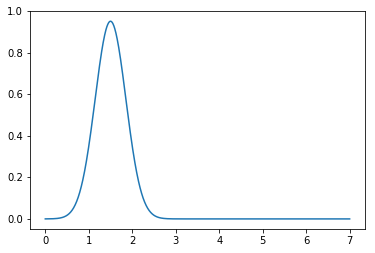

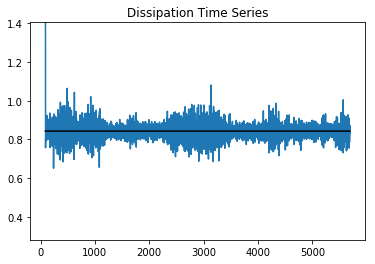

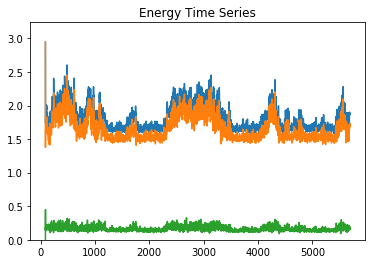

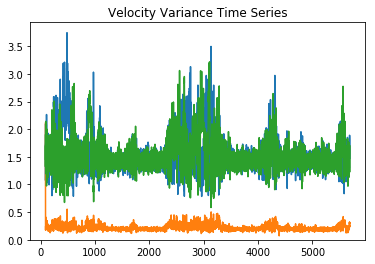

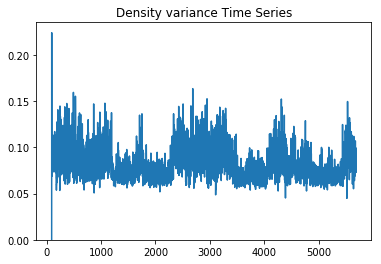

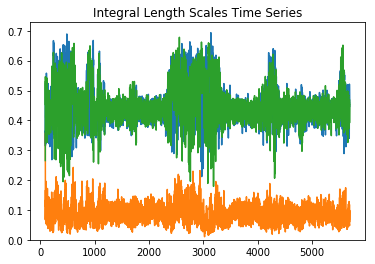

Dissipation is  0.841481057553488
Reynolds number is  87.0613808357883 or  20.476948442075393
Froude number is  0.21805193549378363 or  0.9270865066494729
The Gibson number is  4.139476704720467 or  17.599719942158348


In [29]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N2-3232-Eps084'
pltPowerInput = True
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.0085


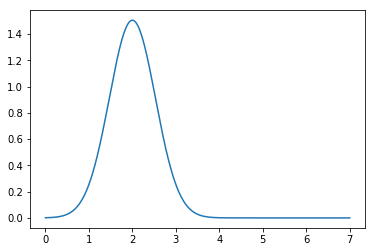

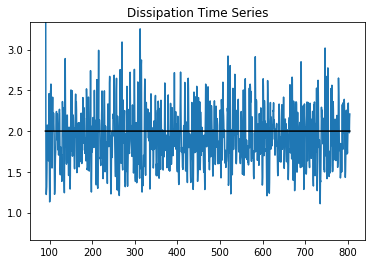

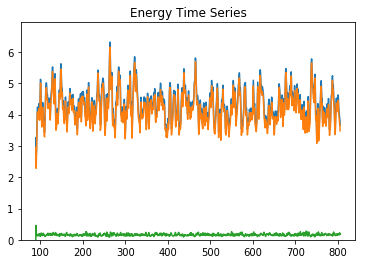

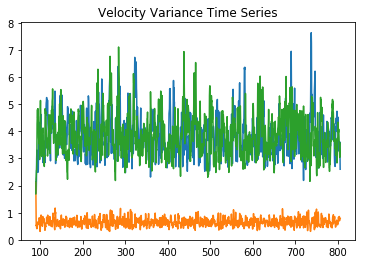

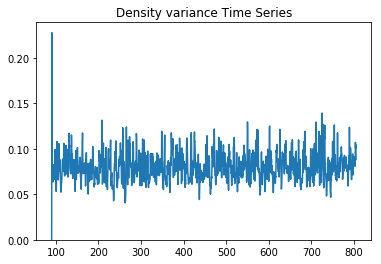

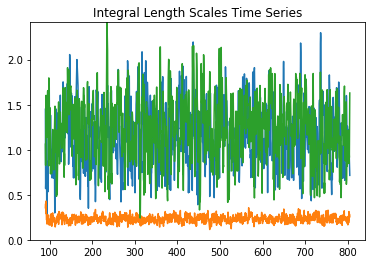

Dissipation is  1.9210815693470724
Reynolds number is  1078.1117118480825 or  253.6729483196166
Froude number is  0.21048476945588934 or  0.8945616654012358
The Gibson number is  47.76448681402445 or  202.9993855700021


In [30]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N2-12832-Eps200'
pltPowerInput = True
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.0065


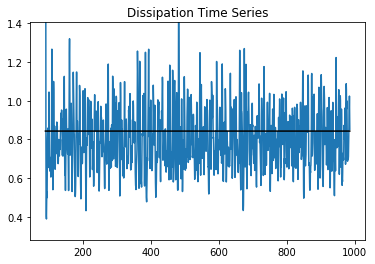

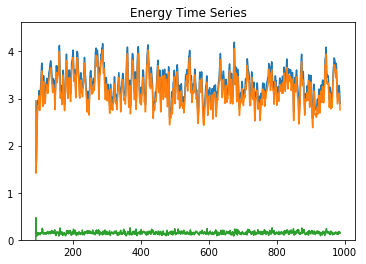

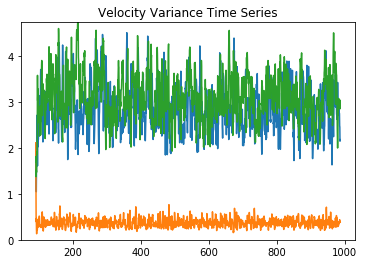

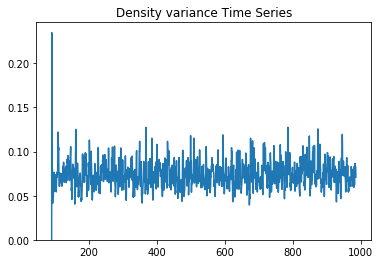

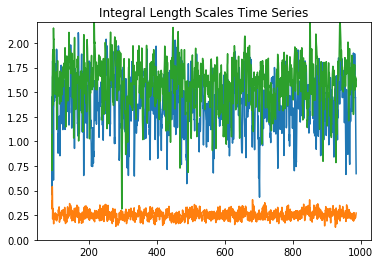

Dissipation is  0.8076310308804229
Reynolds number is  2197.8566264471715 or  324.99430208584005
Froude number is  0.10428745368950643 or  0.7052704298989333
The Gibson number is  23.903609534944305 or  161.6542390903417


In [31]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N2-12832-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.0085


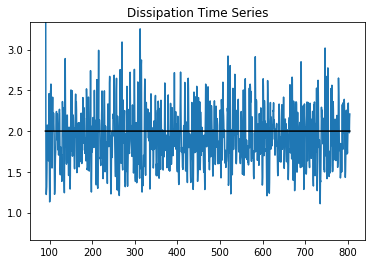

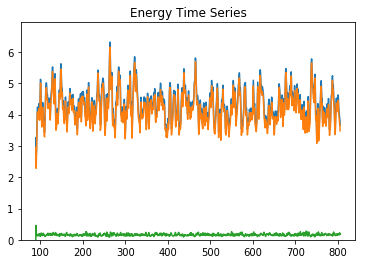

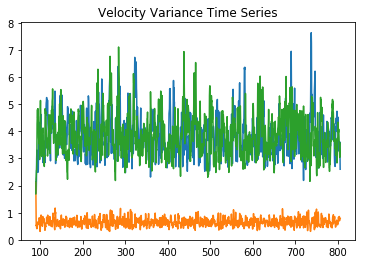

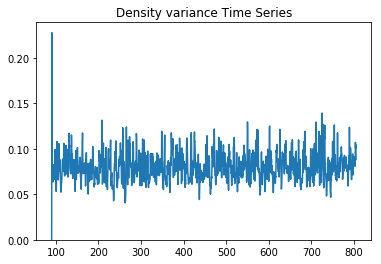

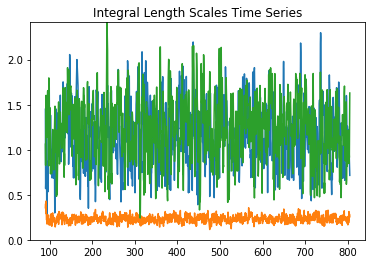

Dissipation is  1.9210815693470724
Reynolds number is  1078.1117118480825 or  253.6729483196166
Froude number is  0.21048476945588934 or  0.8945616654012358
The Gibson number is  47.76448681402445 or  202.9993855700021


In [32]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N2-12832-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.00238


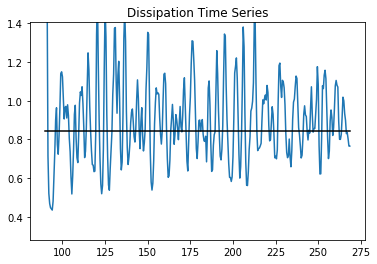

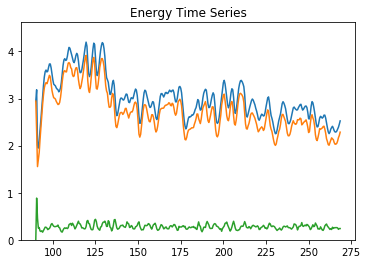

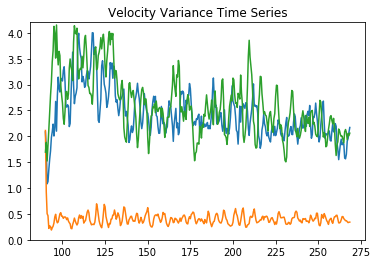

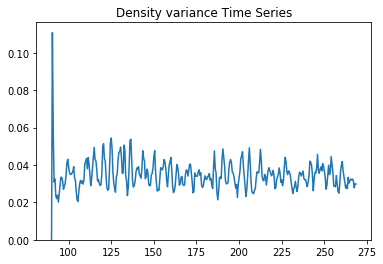

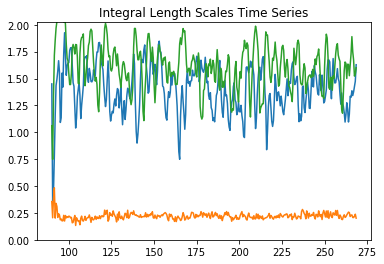

Dissipation is  0.9177887044282694
Reynolds number is  4427.081760805879 or  820.6340238755098
Froude number is  0.059969962068074346 or  0.3235204945731905
The Gibson number is  15.921540687689536 or  85.8920789678247


In [33]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'F025_25664'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.00251215


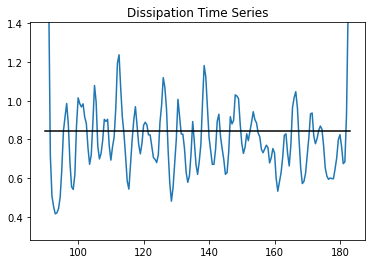

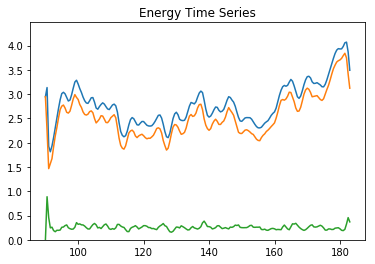

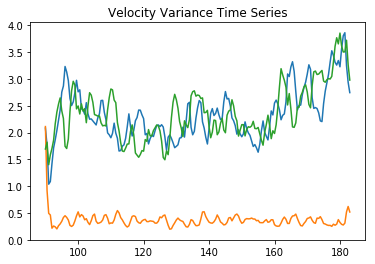

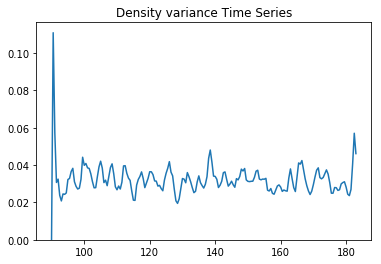

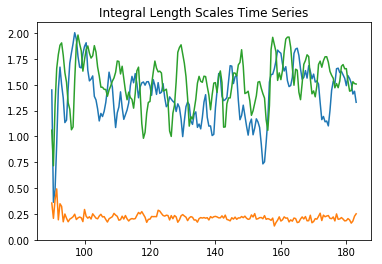

Dissipation is  0.836425373487488
Reynolds number is  3945.5940501345594 or  739.4820666163812
Froude number is  0.059258877885432056 or  0.3161827535213302
The Gibson number is  13.855405704639509 or  73.92715628732876


In [34]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N4-25664-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.0033545


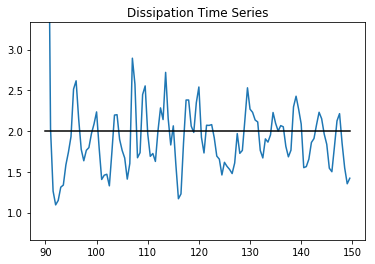

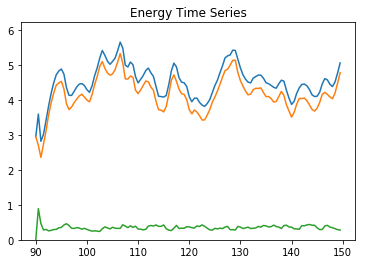

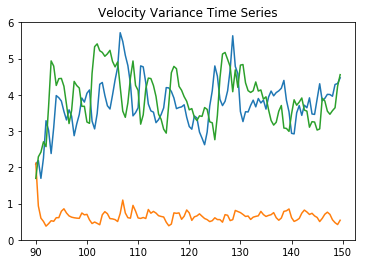

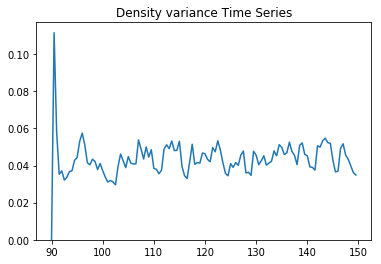

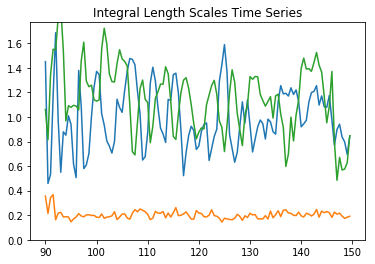

Dissipation is  1.9385393809851974
Reynolds number is  3201.9238364100925 or  605.1582423704627
Froude number is  0.089282893880964 or  0.4724004501389979
The Gibson number is  25.52392818439289 or  135.0484358145725


In [35]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N4-25664-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.00099695


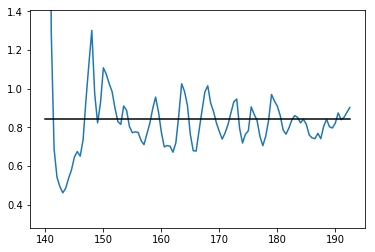

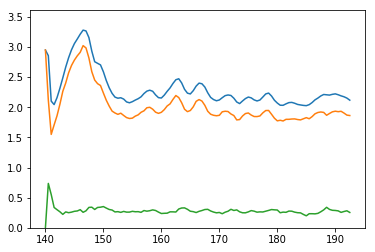

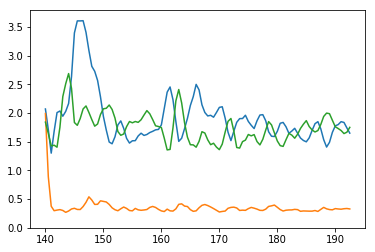

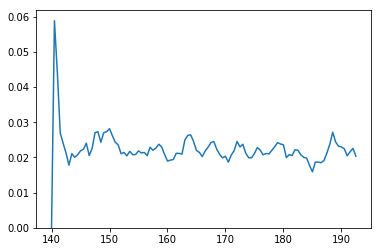

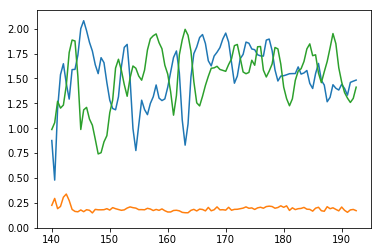

Reynolds number is  5445.566447739054 or  1679.3176202197856
Froude number is  0.06778011383030332 or  0.2197923187692906
The Gibson number is  25.017715501358 or  81.12558964006234


In [111]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N5-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput)

viscosity is  0.00099695


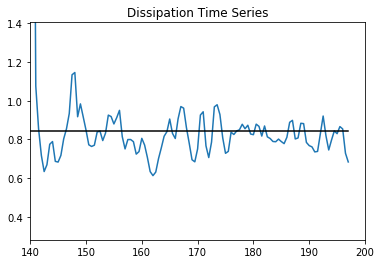

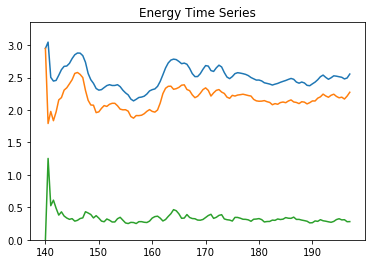

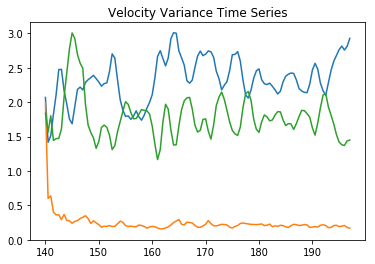

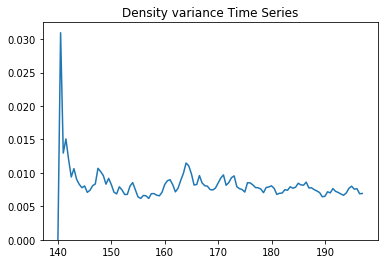

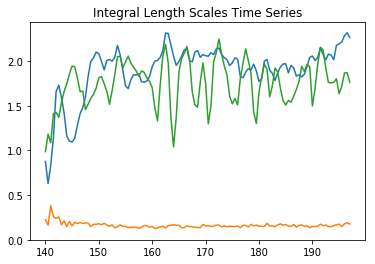

Dissipation is  0.8877818482553239
Reynolds number is  6658.271268842998 or  1938.705921935793
Froude number is  0.03437025086068367 or  0.11804082879166829
The Gibson number is  7.865510025980002 or  27.01322507360331


In [28]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N9-512128-Eps084-0331'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput, 140, 200)

viscosity is  0.00099695


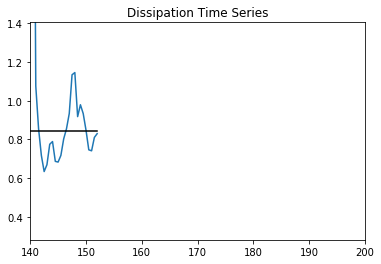

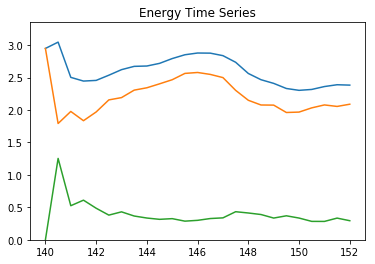

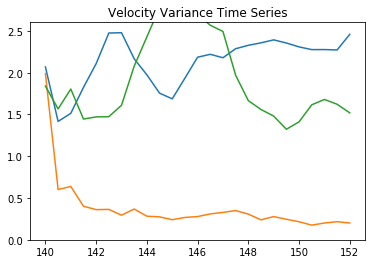

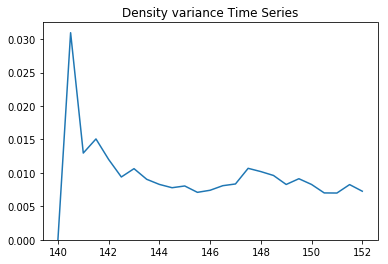

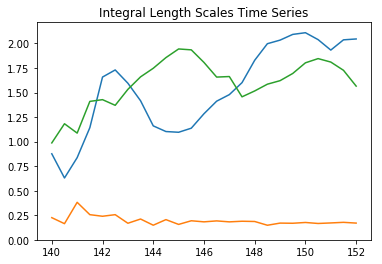

Dissipation is  1.1458797224442687
Reynolds number is  4866.994281872643 or  1785.3097000503244
Froude number is  0.046403494318667485 or  0.12650216458326433
The Gibson number is  10.480022302256568 or  28.56994986222431


In [27]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N9-512128-Eps084-0427'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput, 140, 200)

viscosity is  0.00133124


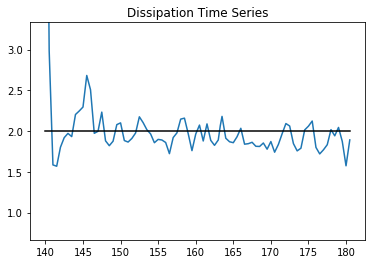

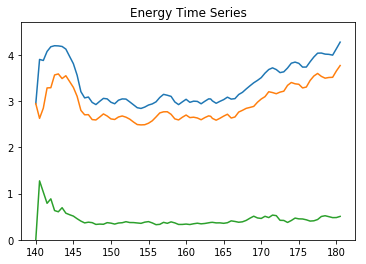

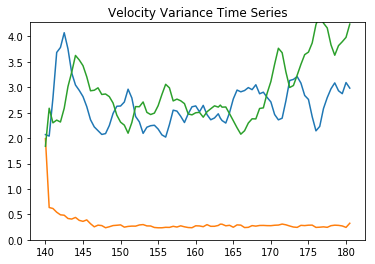

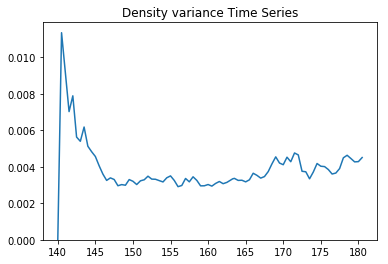

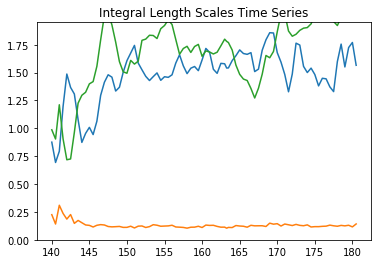

Reynolds number is  3992.3358156272775 or  1575.9940089473541
Froude number is  0.03493785480412136 or  0.0885051899079514
The Gibson number is  4.87325947825634 or  12.345026848726938


In [6]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N15-512128-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput)

viscosity is  0.00133124


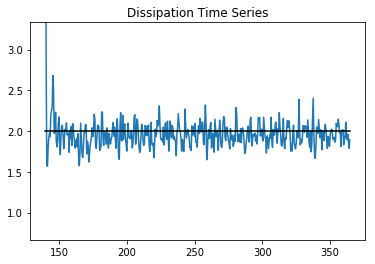

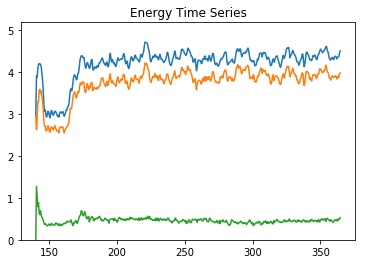

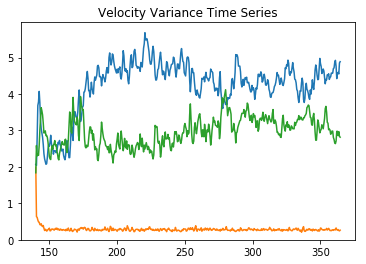

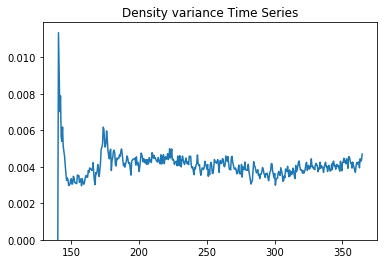

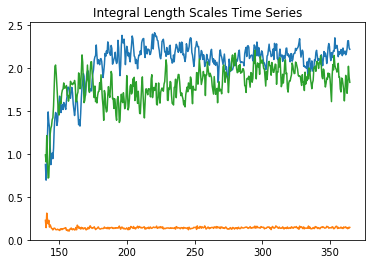

Reynolds number is  6814.7969940722105 or  1979.779172584798
Froude number is  0.026439710224592763 or  0.09101078557536825
The Gibson number is  4.763940243148313 or  16.3984378149408


In [5]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS/secondAttempt'
bName = 'N15-512128-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput)

viscosity is  0.00099695


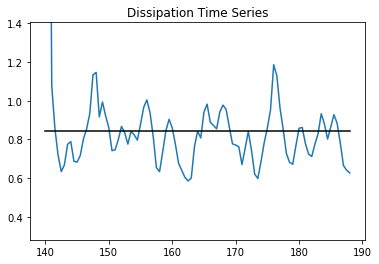

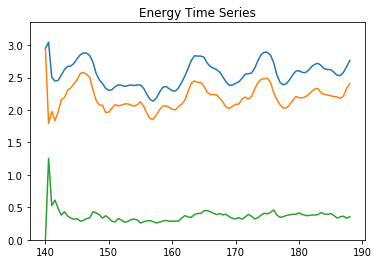

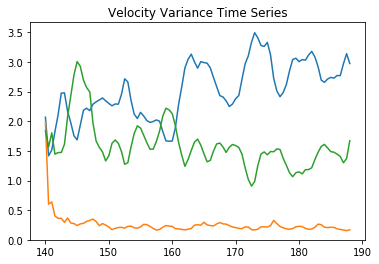

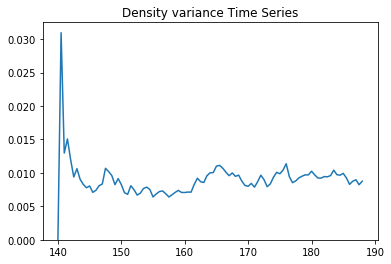

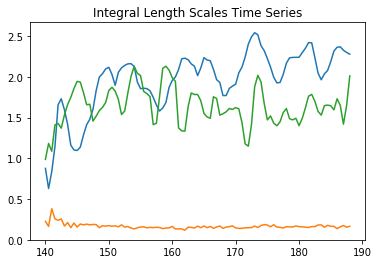

Reynolds number is  6655.6363690964645 or  1931.8394898854554
Froude number is  0.034553709652136944 or  0.11904556659704592
The Gibson number is  7.9465559500844805 or  27.377733537053928


In [7]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS/secondAttempt'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput)

viscosity is  0.00099695


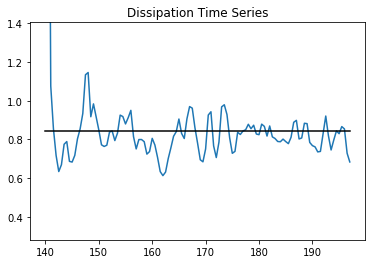

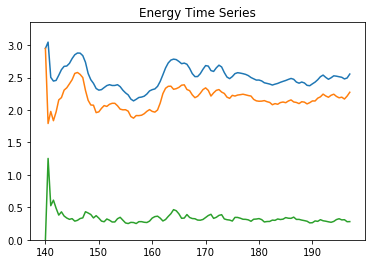

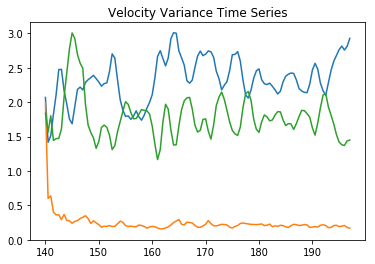

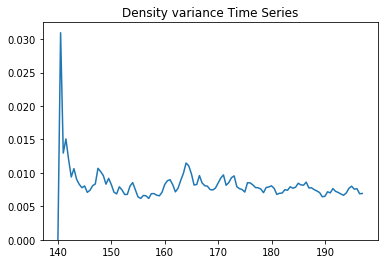

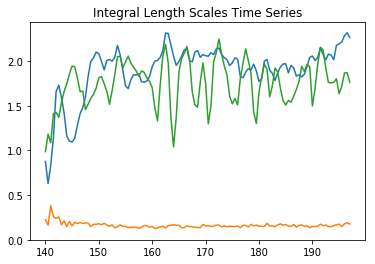

Reynolds number is  6658.271268842998 or  1938.705921935793
Froude number is  0.03437025086068367 or  0.11804082879166829
The Gibson number is  7.865510025980002 or  27.01322507360331


In [8]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput)

viscosity is  0.00251215


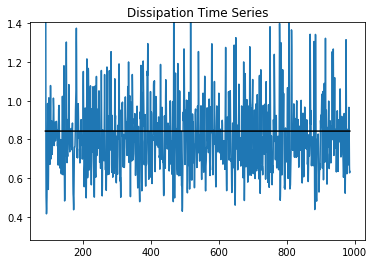

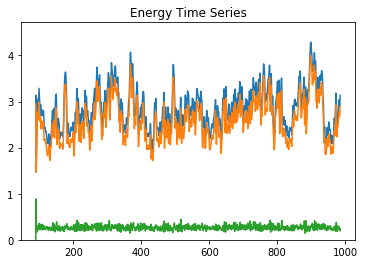

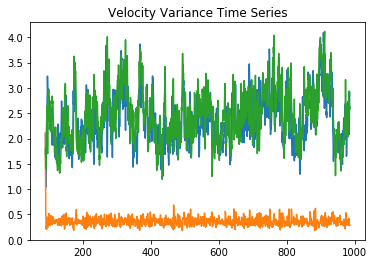

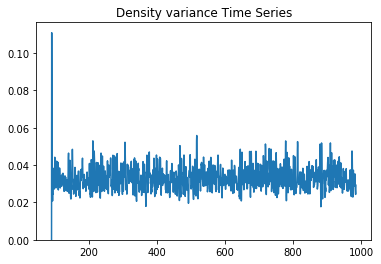

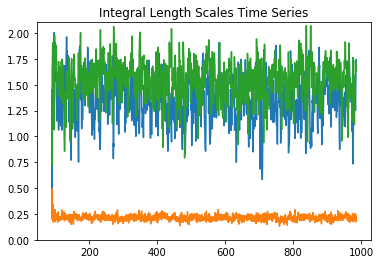

Reynolds number is  4346.5516995360895 or  746.1626121623459
Froude number is  0.05520550012974275 or  0.321583467868081
The Gibson number is  13.24675631049406 or  77.16509808480049


In [9]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS/secondAttempt'
bName = 'N4-25664-Eps084'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput)

viscosity is  0.0033545


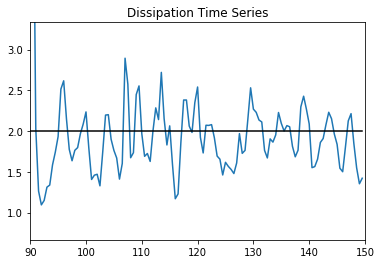

In [19]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bName = 'N4-25664-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, pltPowerInput,90,150)

viscosity is  0.0033545
Moving average of  500  pts out of  1151


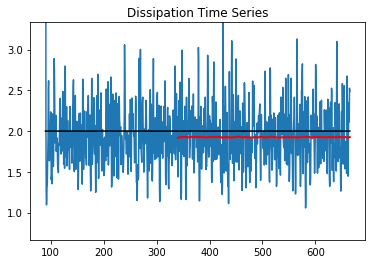

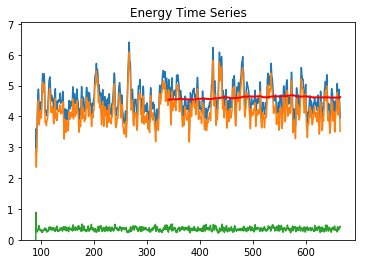

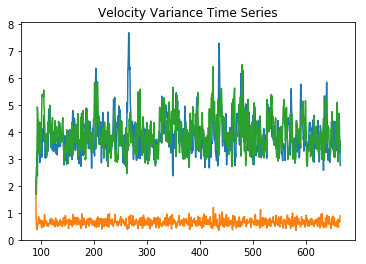

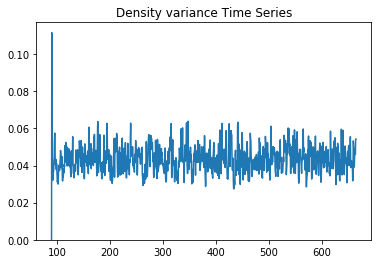

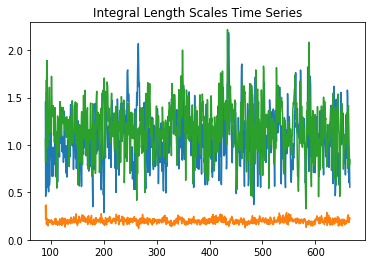

Dissipation is  1.9298339748275977
Reynolds number is  3340.900697886884 or  625.9344489385659
Froude number is  0.08697699896477519 or  0.4642363382208481
The Gibson number is  25.273908263414963 or  134.89849919389803


In [72]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS/secondAttempt'
bName = 'N4-25664-Eps200'
pltPowerInput = False
processPBSim(bPath, bName, bName, pltPowerInput, wind=500)

viscosity is  0.00099695


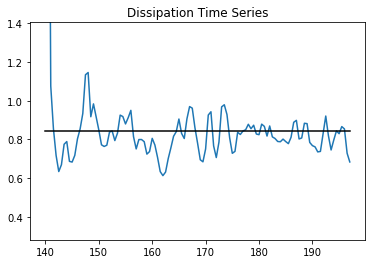

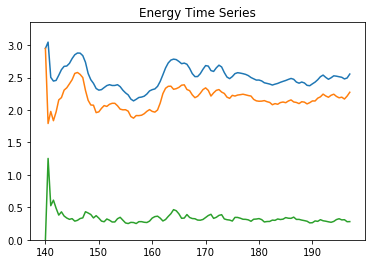

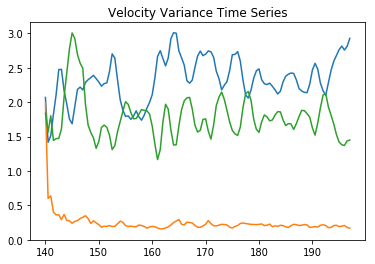

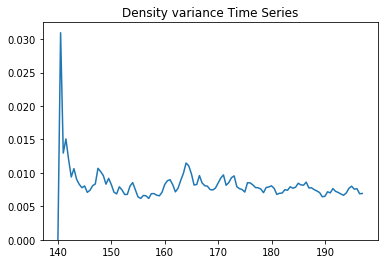

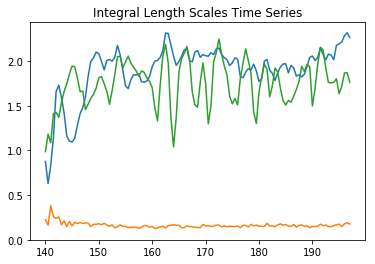

Reynolds number is  6658.271268842998 or  1938.705921935793
Froude number is  0.03437025086068367 or  0.11804082879166829
The Gibson number is  7.865510025980002 or  27.01322507360331


In [17]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N9-512128-Eps084-0331'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput)

viscosity is  0.00099695
Moving average of  100  pts out of  387


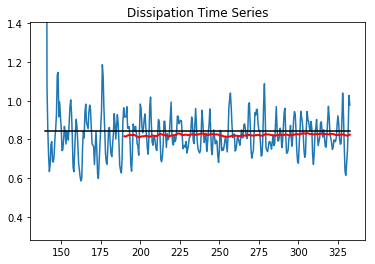

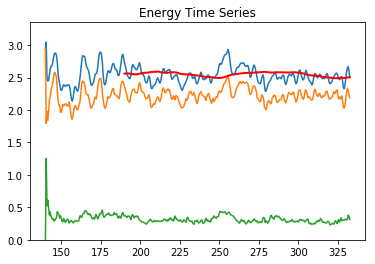

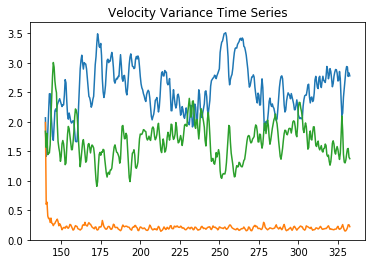

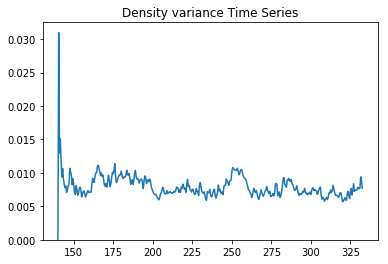

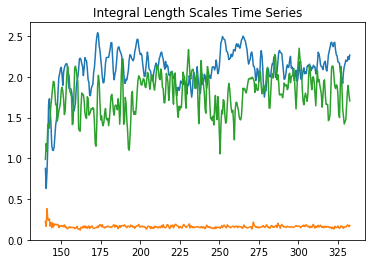

Dissipation is  0.84287405987251
Reynolds number is  7452.797381121433 or  2027.9171992157674
Froude number is  0.03162626240056144 or  0.116229659517023
The Gibson number is  7.45444052491693 or  27.39581026449752


In [70]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N9-512128-Eps084-0412'
bName = 'N9-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput,wind=100)

viscosity is  0.00099695
Moving average of  100  pts out of  554


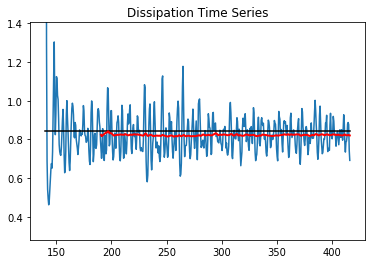

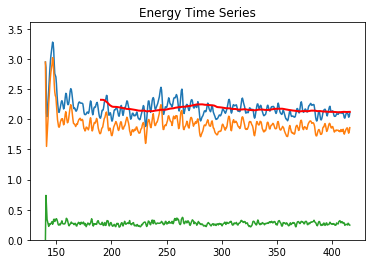

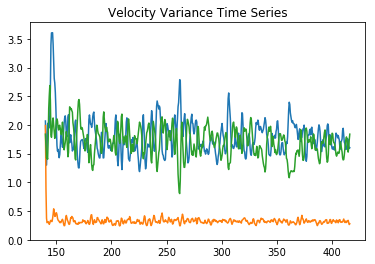

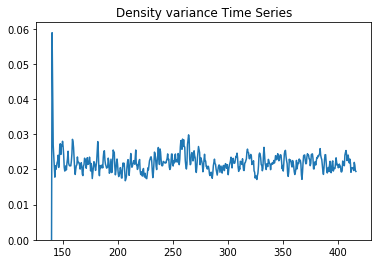

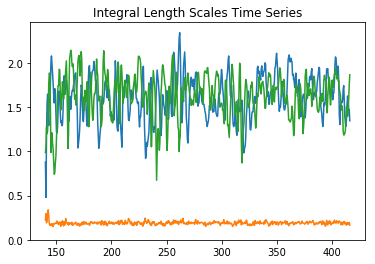

Dissipation is  0.8370026446398446
Reynolds number is  5409.717467679786 or  1689.2323115295808
Froude number is  0.06500911583689793 or  0.20818980734677173
The Gibson number is  22.862467583759305 or  73.21638912420232


In [69]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N5-512128-Eps084-0413'
bName = 'N5-512128-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput,wind=100)

viscosity is  0.00133124
Moving average of  100  pts out of  450


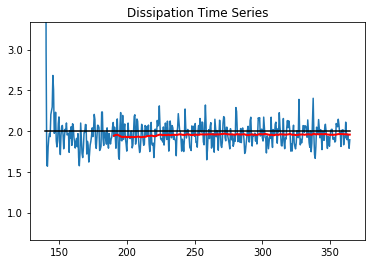

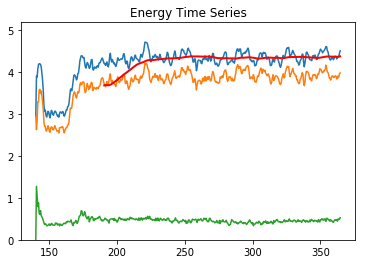

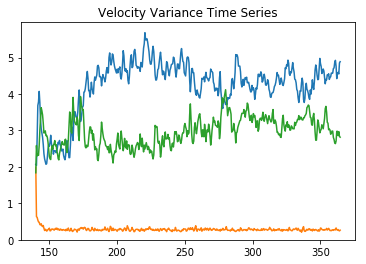

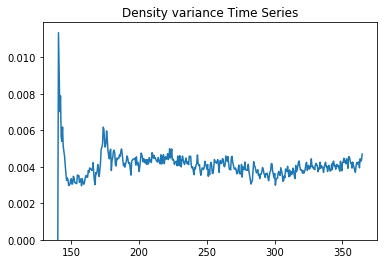

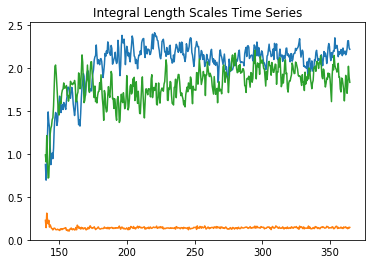

Dissipation is  1.9693688331980046
Reynolds number is  6814.7969940722105 or  1979.779172584798
Froude number is  0.026439710224592763 or  0.09101078557536825
The Gibson number is  4.763940243148313 or  16.3984378149408


In [68]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N15-512128-Eps200-0413'
bName = 'N15-512128-Eps200'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput, wind=100)

viscosity is  0.041


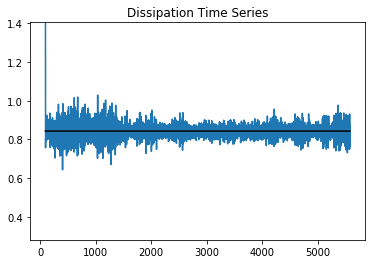

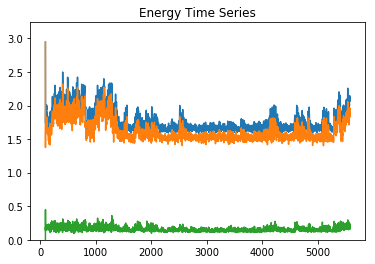

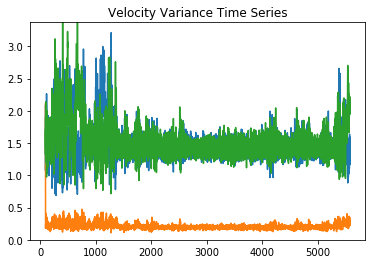

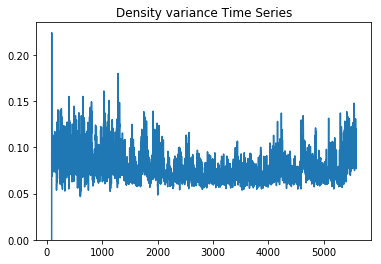

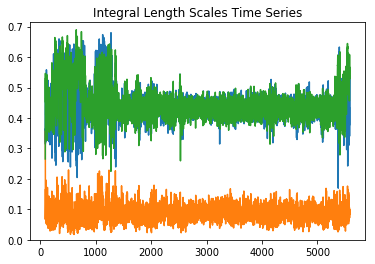

Dissipation is  0.8414474186207327
Reynolds number is  82.98207898602332 or  20.062582762451317
Froude number is  0.22330466377684058 or  0.9236241149448631
The Gibson number is  4.137899116876837 or  17.11501831137695


In [37]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N2-3232-Eps084-new'
bName = 'N2-323232-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput)

viscosity is  0.054


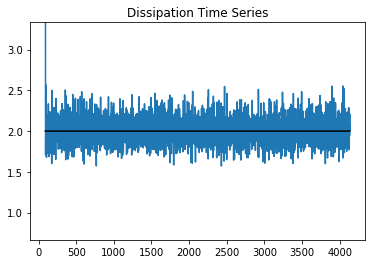

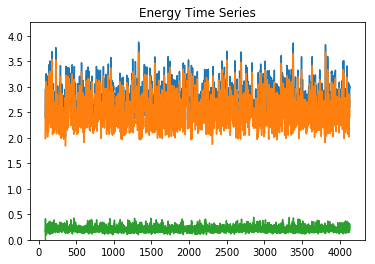

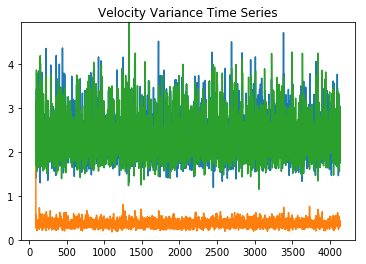

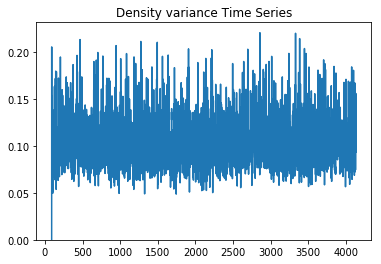

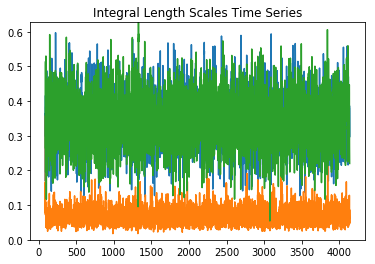

Dissipation is  1.9962324239846254
Reynolds number is  59.641188660005575 or  16.724125404872336
Froude number is  0.365833045646325 or  1.3046253340757854
The Gibson number is  7.982007945894699 or  28.465251859931463


In [38]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N2-3232-Eps200-new'
bName = 'N2-323232-Eps200'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput)

viscosity is  0.016
Moving average of  500  pts out of  1229


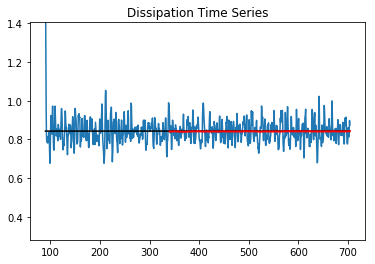

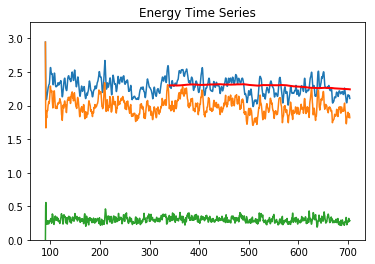

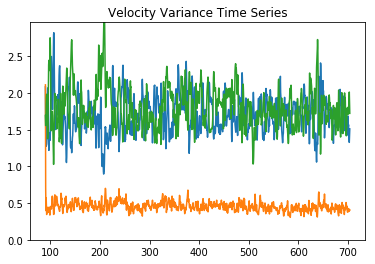

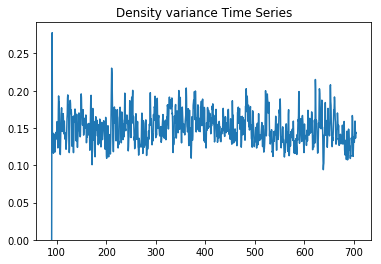

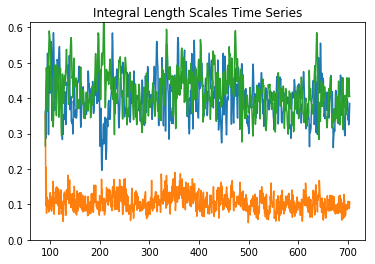

Dissipation is  0.8435418163006109
Reynolds number is  314.5687639370996 or  53.09461940180521
Froude number is  0.17440674160034958 or  1.0333045748446172
The Gibson number is  9.56846191327365 or  56.69009912396829


In [57]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N2-6464-Eps084-new'
bName = 'N2-646464-Eps084'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput, wind=500)

viscosity is  0.0033545
Moving average of  600  pts out of  1151


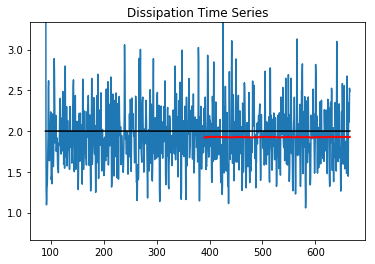

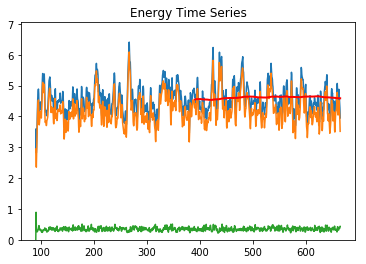

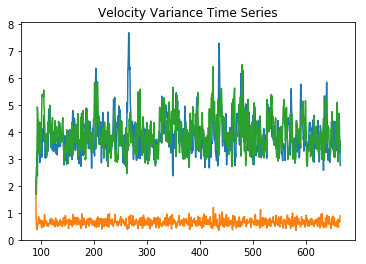

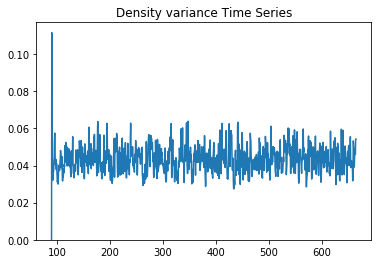

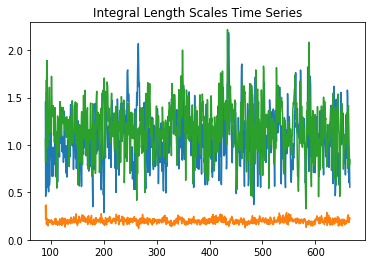

Dissipation is  1.9298339748275977
Reynolds number is  3340.900697886884 or  625.9344489385659
Froude number is  0.08697699896477519 or  0.4642363382208481
The Gibson number is  25.273908263414963 or  134.89849919389803


In [60]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N4-25664-Eps200-new'
bName = 'N4-25664-Eps200'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput, wind=600)

viscosity is  0.0085
Moving average of  500  pts out of  1431


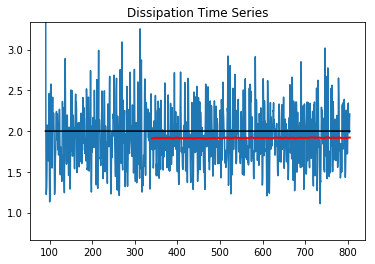

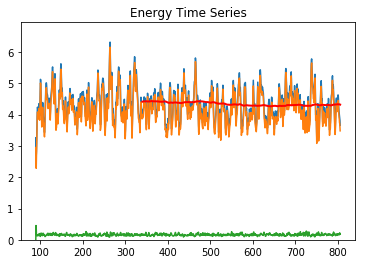

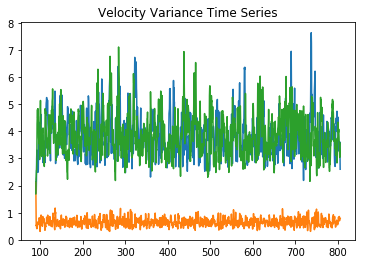

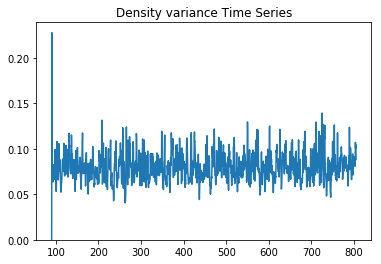

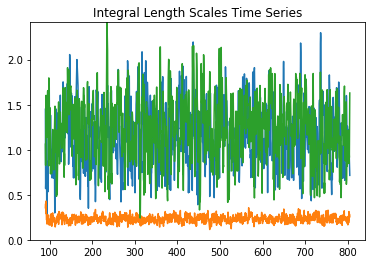

Dissipation is  1.9210815693470724
Reynolds number is  1078.1117118480825 or  253.6729483196166
Froude number is  0.21048476945588934 or  0.8945616654012358
The Gibson number is  47.76448681402445 or  202.9993855700021


In [73]:
bPath = '/Users/jmelvin/Desktop/WorkFromHome/stratDNS'
bFold = 'N2-12832-Eps200'
bName = 'N2-12832-Eps200'
pltPowerInput = False
processPBSim(bPath, bFold, bName, pltPowerInput,wind=500)

viscosity is  0.0065
Moving average of  50  pts out of  1793
         step        time    keDiss    peDiss  totalDiss  targetDiss   rollAvg
0      568883   90.000101  6.654056  0.000000   6.654056    0.842863       NaN
1      569223   90.501389  3.827092  0.671772   4.498864    0.842863       NaN
2      569415   91.000249  1.169221  0.575189   1.744410    0.842863       NaN
3      569572   91.500733  0.530675  0.262197   0.792873    0.842863       NaN
4      569735   92.000446  0.325624  0.160786   0.486411    0.842863       NaN
...       ...         ...       ...       ...        ...         ...       ...
1788  1067570  984.001482  0.698712  0.213236   0.911948    0.842863  0.794776
1789  1067869  984.500460  0.778865  0.201501   0.980365    0.842863  0.800783
1790  1068151  985.001328  0.803955  0.219718   1.023674    0.842863  0.808130
1791  1068433  985.500884  0.702362  0.208590   0.910952    0.842863  0.811195
1792  1068707  986.000702  0.664441  0.188051   0.852492    0.842863  

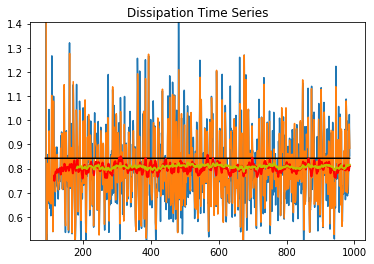

         step        time        ke        pe       tke   rollAvg
0      568883   90.000101  2.946349  0.000000  2.946349       NaN
1      569223   90.501389  2.417131  0.469252  2.886383       NaN
2      569415   91.000249  1.415044  0.416872  1.831916       NaN
3      569572   91.500733  1.511690  0.142930  1.654620       NaN
4      569735   92.000446  1.597962  0.161182  1.759144       NaN
...       ...         ...       ...       ...       ...       ...
1788  1067570  984.001482  3.034093  0.166358  3.200451  3.396704
1789  1067869  984.500460  2.958637  0.165553  3.124190  3.399525
1790  1068151  985.001328  2.857422  0.164004  3.021426  3.398799
1791  1068433  985.500884  2.787809  0.143998  2.931807  3.395188
1792  1068707  986.000702  2.760001  0.142333  2.902334  3.391169

[1793 rows x 6 columns]


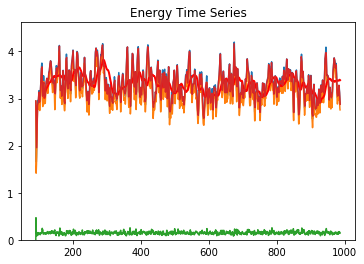

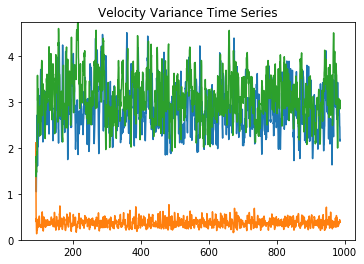

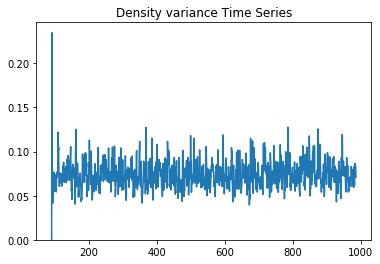

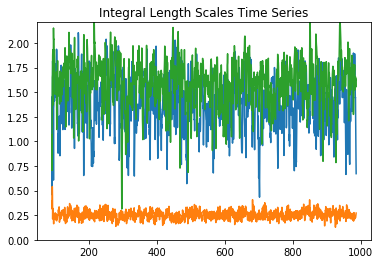

Dissipation is  0.8076310308804225
Reynolds number is  2197.85662644717 or  324.99430208584
Froude number is  0.10428745368950641 or  0.7052704298989331
The Gibson number is  23.90360953494429 or  161.65423909034158


In [56]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'N2-12832-Eps084-0330'
bName = 'N2-12832-Eps084'
pltPowerInput = False
#processPBSim(bPath, bFold, bName, pltPowerInput, wind=50)

%store -r sData

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=50)

viscosity is  0.0065
Moving average of  50  pts out of  119
       step        time    keDiss    peDiss  totalDiss  targetDiss   rollAvg
0    568883   90.000101  1.290251  0.000000   1.290251    0.842863       NaN
1    569113   90.500489  0.955288  0.328958   1.284245    0.842863       NaN
2    569312   91.000442  0.774061  0.478030   1.252091    0.842863       NaN
3    569510   91.500229  0.734737  0.347633   1.082370    0.842863       NaN
4    569707   92.000496  0.620871  0.275899   0.896770    0.842863       NaN
..      ...         ...       ...       ...        ...         ...       ...
114  595328  147.000574  0.581393  0.257884   0.839278    0.842863  0.853759
115  595561  147.500493  0.515095  0.219485   0.734580    0.842863  0.847690
116  595818  148.000761  0.488682  0.190491   0.679173    0.842863  0.841507
117  596063  148.500381  0.506853  0.197645   0.704497    0.842863  0.837147
118  596343  149.000495  0.521975  0.231279   0.753255    0.842863  0.834705

[119 rows x 7 c

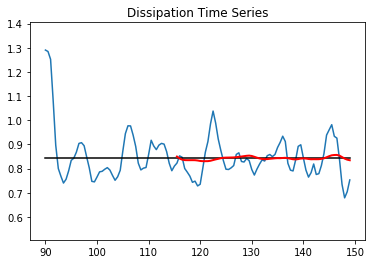

       step        time        ke        pe       tke   rollAvg
0    568883   90.000101  2.945238  0.000000  2.945238       NaN
1    569113   90.500489  2.186133  0.552954  2.739087       NaN
2    569312   91.000442  1.889127  0.625758  2.514885       NaN
3    569510   91.500229  2.011886  0.336807  2.348693       NaN
4    569707   92.000496  1.976798  0.297860  2.274658       NaN
..      ...         ...       ...       ...       ...       ...
114  595328  147.000574  1.946317  0.310931  2.257248  2.436778
115  595561  147.500493  2.012381  0.274302  2.286683  2.431761
116  595818  148.000761  2.108097  0.245919  2.354016  2.429891
117  596063  148.500381  2.180902  0.252674  2.433577  2.430801
118  596343  149.000495  2.212852  0.276681  2.489534  2.433338

[119 rows x 6 columns]


TypeError: list indices must be integers or slices, not tuple

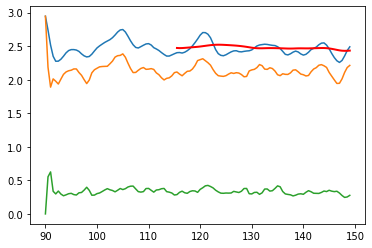

In [54]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'N2-128128-Eps084'
bName = 'N2-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=50)

viscosity is  0.0065
Moving average of  100  pts out of  1831


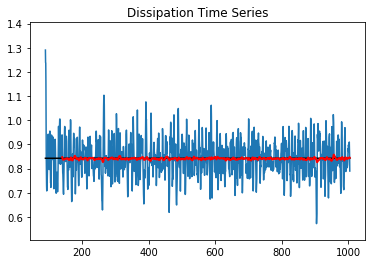

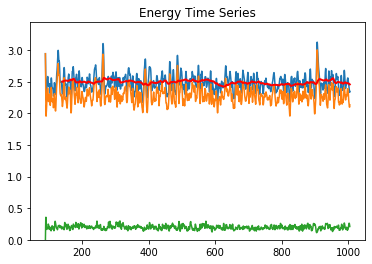

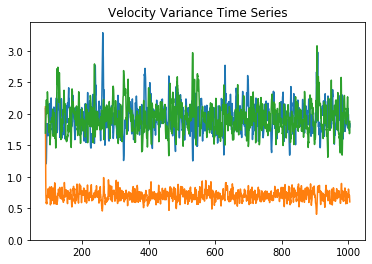

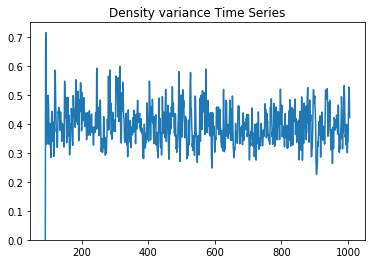

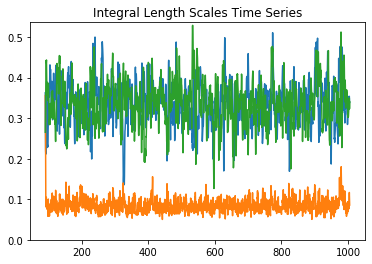

Dissipation is  0.841645762605264
Reynolds number is  865.7669186211475 or  124.43486113329446
Froude number is  0.34519050617772196 or  2.4016944942030993
The Gibson number is  103.1617433328784 or  717.7572573430108


In [16]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'N1-128128-Eps084'
bName = 'N1-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bName, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  1776


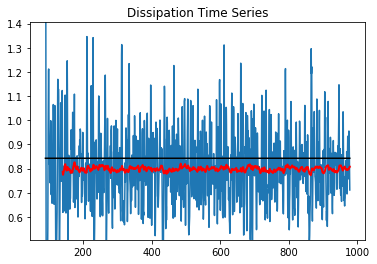

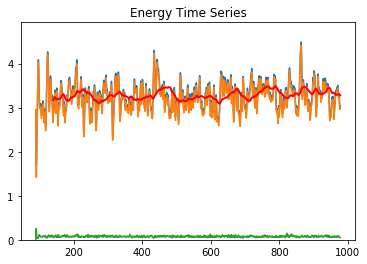

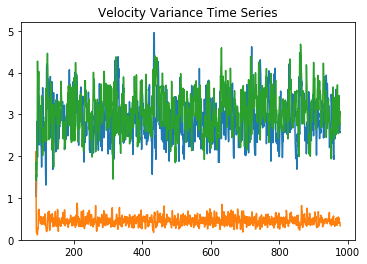

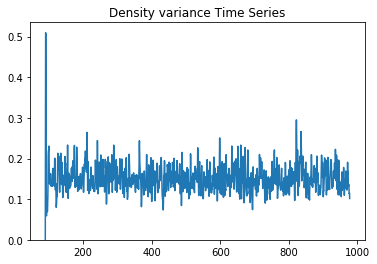

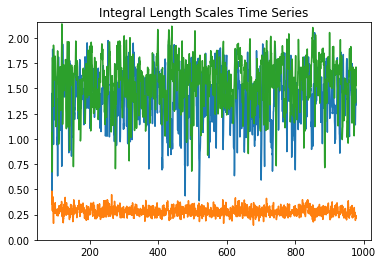

Dissipation is  0.8029937812815828
Reynolds number is  1921.689263992797 or  324.5967159025204
Froude number is  0.23838248852101224 or  1.4112806645039702
The Gibson number is  109.20231927207149 or  646.5035358252806


In [14]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'N1-12832-Eps084'
bName = 'N1-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bName, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  1838


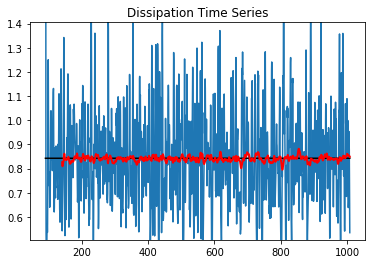

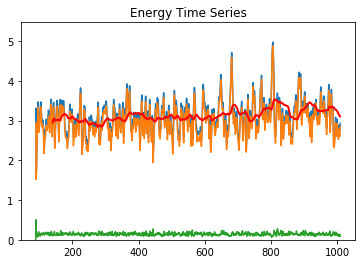

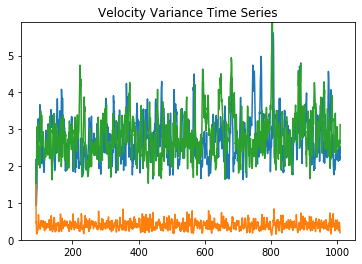

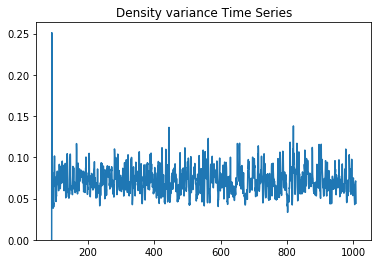

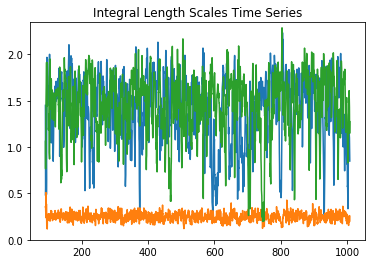

Dissipation is  0.8459213960937304
Reynolds number is  1791.8431338583034 or  307.52878565020944
Froude number is  0.1194617848729447 or  0.6960544474900537
The Gibson number is  25.57160488146784 or  148.99517302654306


In [5]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/FIX'
bFold = 'N2-12832-Eps084'
bName = 'N2-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  1896


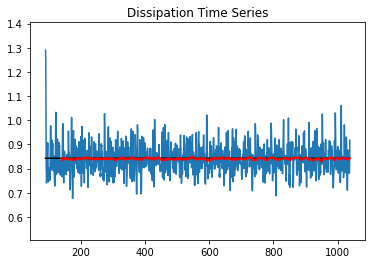

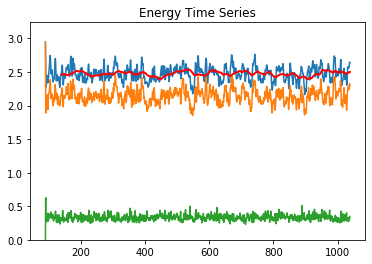

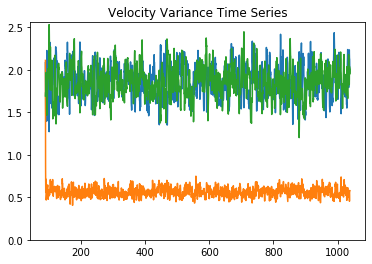

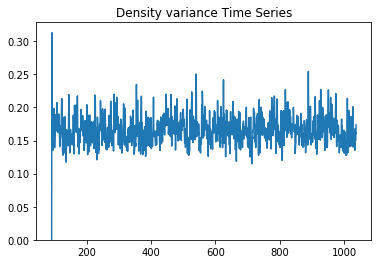

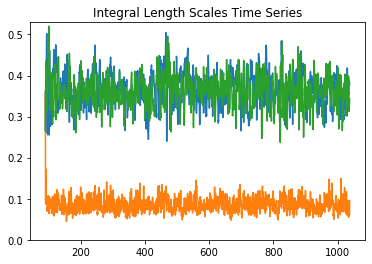

Dissipation is  0.841328907357151
Reynolds number is  929.1380760488973 or  126.62504886132452
Froude number is  0.1540623333701149 or  1.1304649538645404
The Gibson number is  22.053280444429607 or  161.82060932623725


In [3]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/FIX'
bFold = 'N2-128128-Eps084'
bName = 'N2-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  171


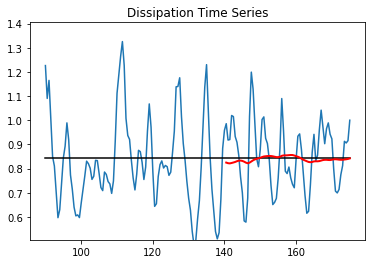

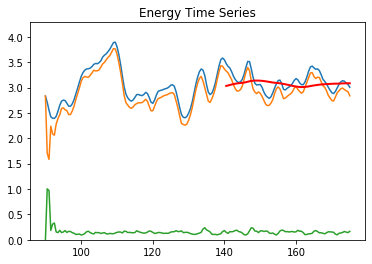

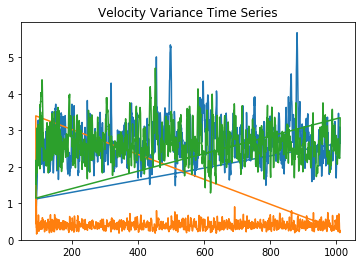

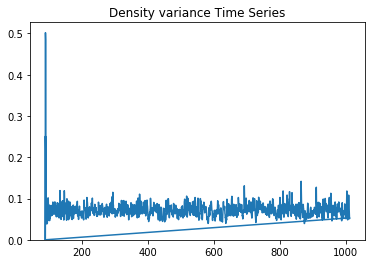

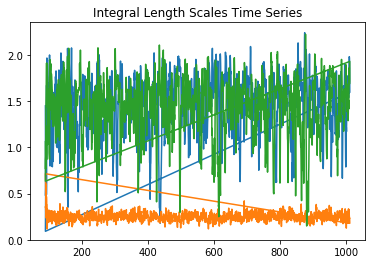

Dissipation is  0.8403886160654142
Reynolds number is  1695.1658891075072 or  303.2973671608087
Froude number is  0.12168907861791706 or  0.6801350670500317
The Gibson number is  25.102409518383688 or  140.30042116194866


In [5]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/FIX'
bFold = 'N2-12832-Eps084'
bName = 'N2-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  1866


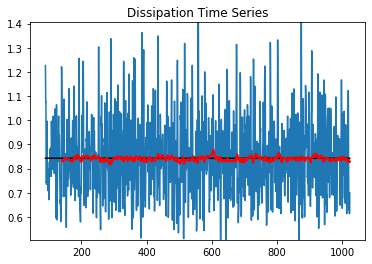

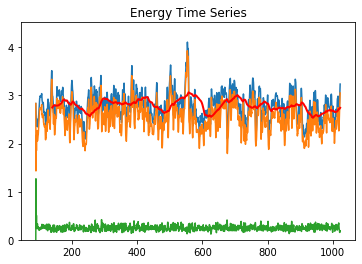

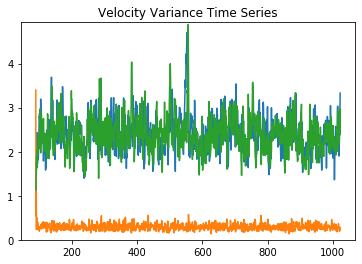

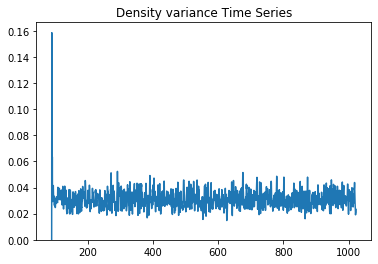

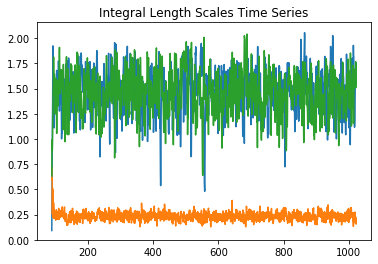

Dissipation is  0.840509987693834
Reynolds number is  1551.8851740537893 or  288.27492098122985
Froude number is  0.05927595471689391 or  0.3191032885896482
The Gibson number is  5.4527639724933215 or  29.354144084833557


In [3]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests'
bFold = 'N4-12832-Eps084'
bName = 'N4-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.00251215
Moving average of  100  pts out of  1188


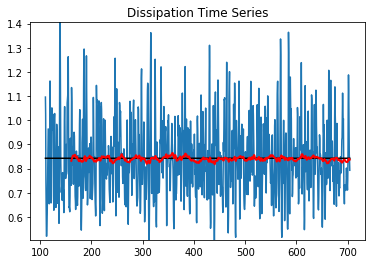

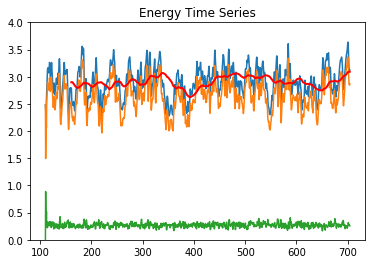

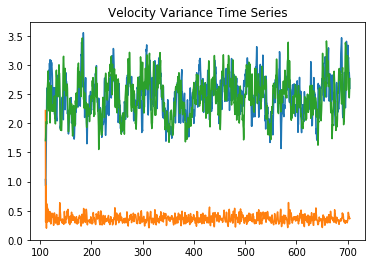

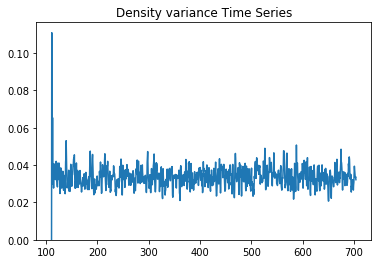

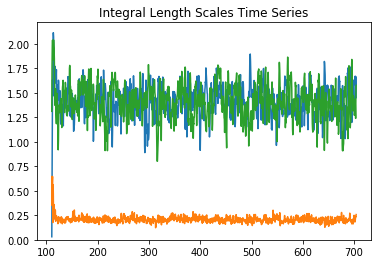

Dissipation is  0.8398418997835577
Reynolds number is  4375.696958345069 or  742.0606024391294
Froude number is  0.05594978978550751 or  0.3299182360305586
The Gibson number is  13.69758976831213 or  80.77035984507539


In [6]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests'
bFold = 'N4-25664-Eps084'
bName = 'N4-25664-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.00251215
Moving average of  100  pts out of  2126


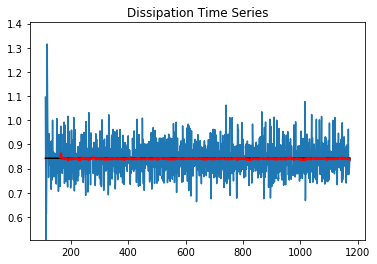

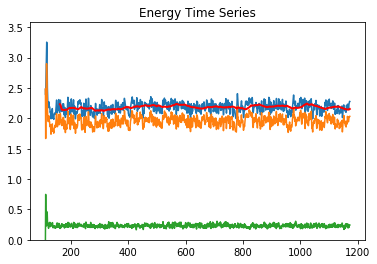

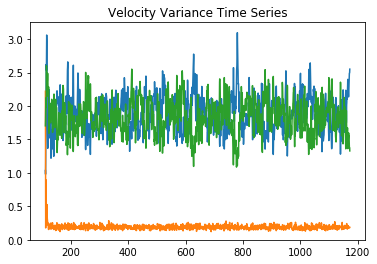

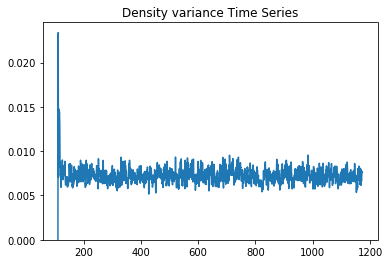

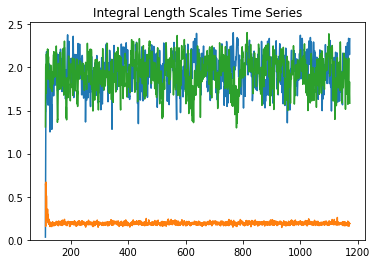

Dissipation is  0.8410744774884807
Reynolds number is  2208.5618416687958 or  756.4533538642191
Froude number is  0.04187766731916308 or  0.12226717957787718
The Gibson number is  3.873241080026337 or  11.308420286898047


In [7]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests'
bFold = 'N8-25664-Eps084'
bName = 'N8-25664-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.00251215
Moving average of  100  pts out of  1073


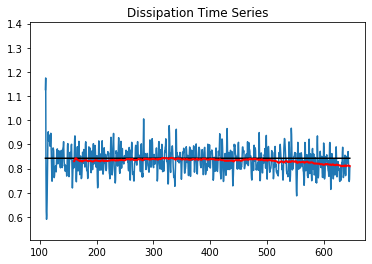

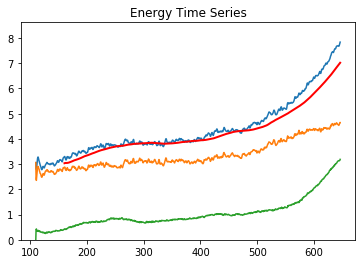

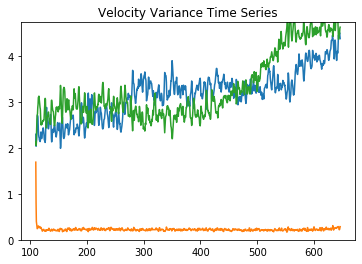

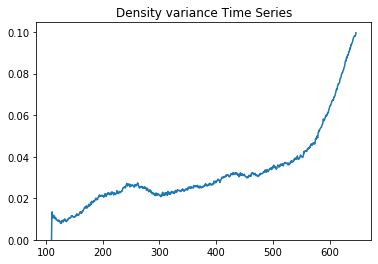

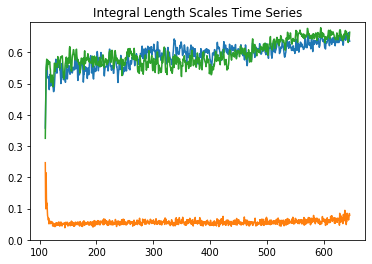

Dissipation is  0.8320413148083434
Reynolds number is  6792.302527782941 or  551.248730076737
Froude number is  0.023692168849172766 or  0.2919269824721316
The Gibson number is  3.8126475441219068 or  46.97816818168394


In [10]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests'
bFold = 'N8-256256-Eps084'
bName = 'N8-256256-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  2424


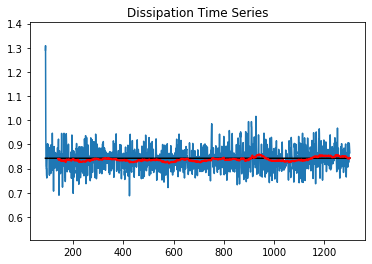

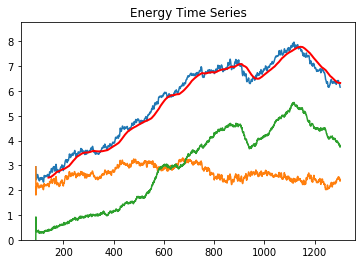

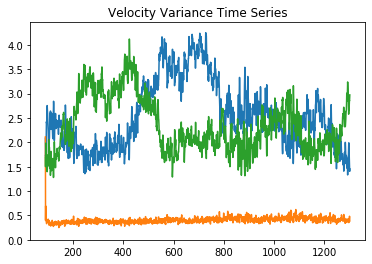

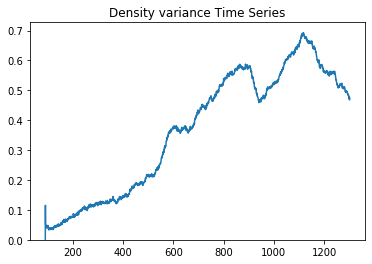

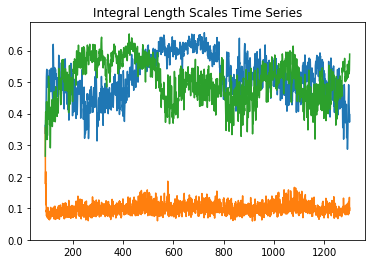

Dissipation is  0.8383617135110397
Reynolds number is  1544.6587121400644 or  172.36544329409676
Froude number is  0.0611071150993125 or  0.547613465367576
The Gibson number is  5.767878455843404 or  51.68903660220292


In [13]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests'
bFold = 'N4-128128-Eps084'
bName = 'N4-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

viscosity is  0.0065
Moving average of  100  pts out of  1896


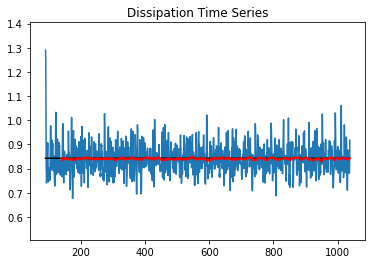

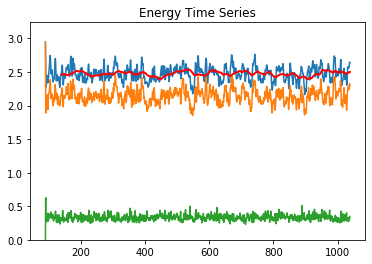

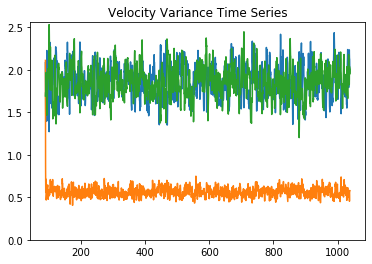

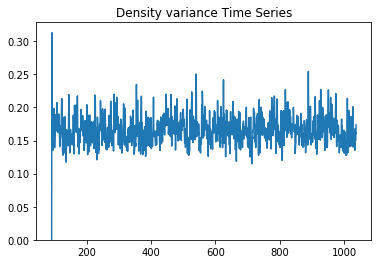

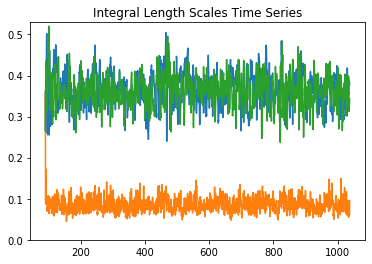

Dissipation is  0.841328907357151
Reynolds number is  929.1380760488973 or  126.62504886132452
Froude number is  0.1540623333701149 or  1.1304649538645404
The Gibson number is  22.053280444429607 or  161.82060932623725


In [14]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/FIX'
bFold = 'N2-128128-Eps084'
bName = 'N2-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

['N15-512128-Eps084restart02659533.h5', 'N15-512128-Eps084stats', 'N15-512128-Eps084restart02654533.h5']
viscosity is  0.00099695
Moving average of  100  pts out of  127


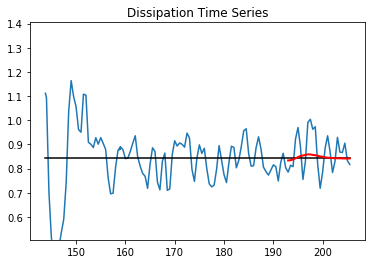

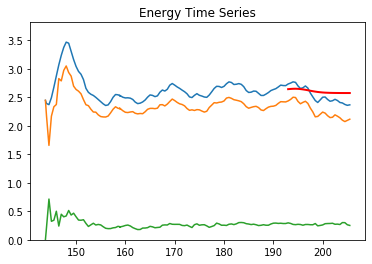

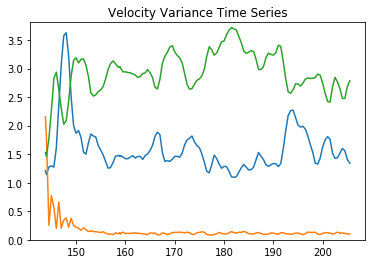

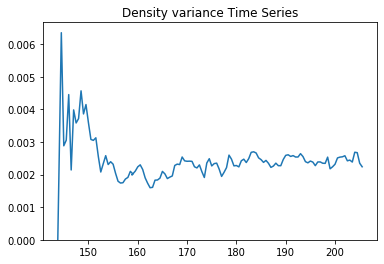

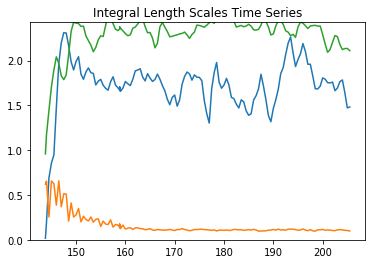

Dissipation is  0.8452544023870161
Reynolds number is  8112.90005421048 or  2132.4178794409845
Froude number is  0.01861397581896219 or  0.07081788559675704
The Gibson number is  2.8109583879086935 or  10.694444403939343


In [10]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/'
bFold = 'N15-512128-Eps084'
bName = 'N15-512128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

['N15-512512-Eps084restart02675533.h5', 'N15-512512-Eps084stats', 'N15-512512-Eps084restart02670533.h5']
viscosity is  0.00099695
Moving average of  100  pts out of  125


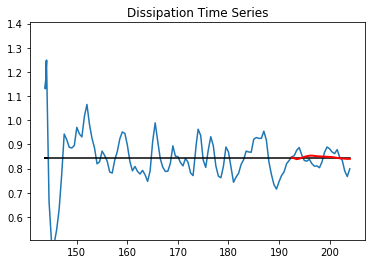

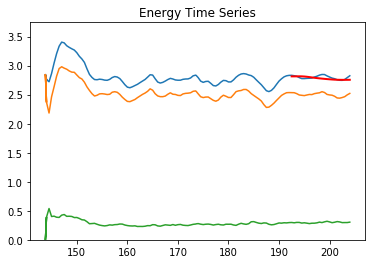

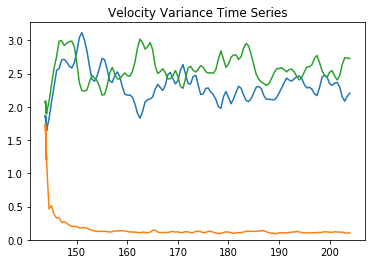

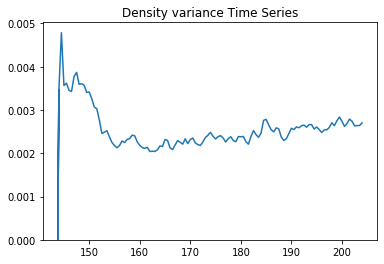

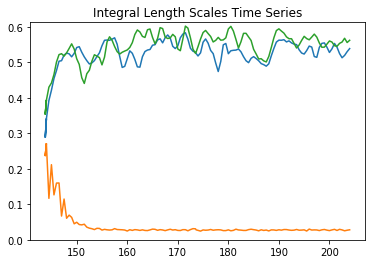

Dissipation is  0.8502465127848563
Reynolds number is  9388.718632024546 or  1142.94297683986
Froude number is  0.01735228520875819 or  0.1425405525463047
The Gibson number is  2.826960098255179 or  23.222097238712138


In [11]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/'
bFold = 'N15-512512-Eps084'
bName = 'N15-512512-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100)

['N8-256256-Eps084restart01187458.h5', 'N8-256256-Eps084restart01408458.h5', 'N8-256256-Eps084restart01327458.h5', 'N8-256256-Eps084restart01413458.h5', 'N8-256256-Eps084restart01488458.h5', 'N8-256256-Eps084restart01304458.h5', 'N8-256256-Eps084restart01451458.h5', 'N8-256256-Eps084restart01267458.h5', 'N8-256256-Eps084restart01086458.h5', 'N8-256256-Eps084restart01532458.h5', 'N8-256256-Eps084restart01159458.h5', 'N8-256256-Eps084restart01164458.h5', 'N8-256256-Eps084restart01409458.h5', 'N8-256256-Eps084restart01134458.h5', 'N8-256256-Eps084restart01350458.h5', 'N8-256256-Eps084restart01269458.h5', 'N8-256256-Eps084restart01403458.h5', 'N8-256256-Eps084restart01427458.h5', 'N8-256256-Eps084restart01507458.h5', 'N8-256256-Eps084restart01191458.h5', 'N8-256256-Eps084restart01129458.h5', 'N8-256256-Eps084restart01401458.h5', 'N8-256256-Eps084restart01524458.h5', 'N8-256256-Eps084restart01465458.h5', 'N8-256256-Eps084restart01295458.h5', 'N8-256256-Eps084restart01424458.h5', 'N8-256256-

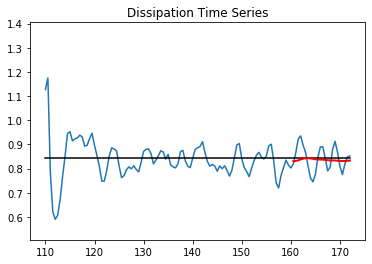

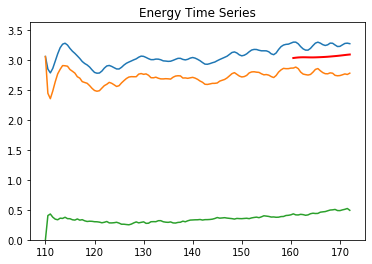

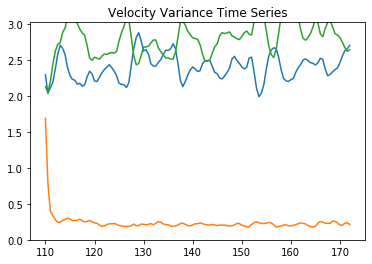

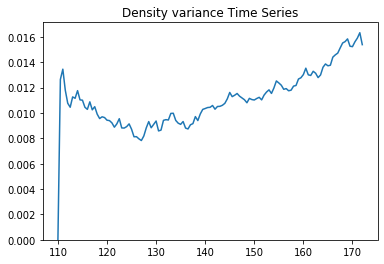

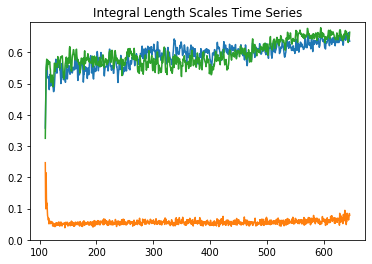

Dissipation is  0.8320413148083434
Reynolds number is  6792.302527782941 or  551.248730076737
Froude number is  0.023692168849172766 or  0.2919269824721316
The Gibson number is  3.8126475441219068 or  46.97816818168394


In [27]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/newTests/'
bFold = 'N8-256256-Eps084'
bName = 'N8-256256-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, endPt=125)

['N2-323232-Eps084stats-old', 'N2-323232-Eps084stats', 'N2-323232-Eps084restart00618883.h5']
viscosity is  0.041
Moving average of  100  pts out of  6724


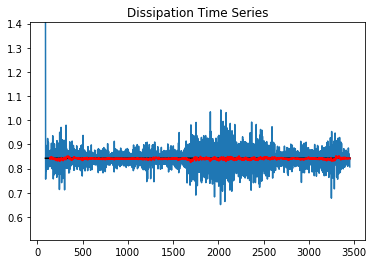

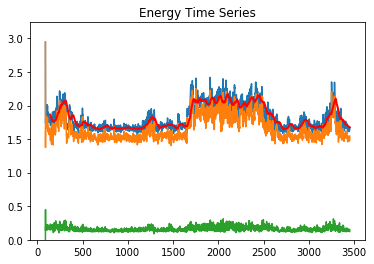

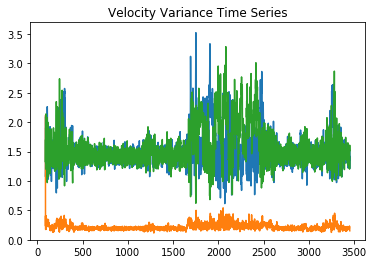

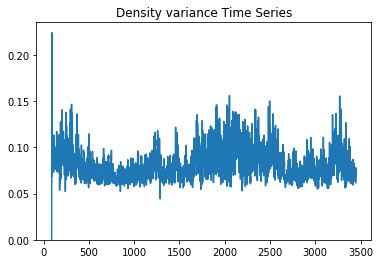

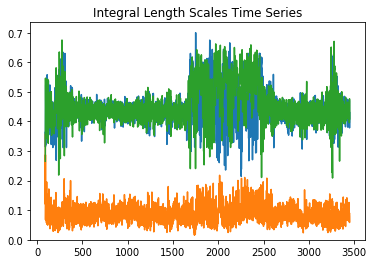

Dissipation is  0.8419228673206977
Reynolds number is  86.08266111609186 or  20.39829093037085
Froude number is  0.2193616427381131 or  0.925726278645193
The Gibson number is  4.142257220290475 or  17.480705896739888


In [5]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N2-323232-Eps084'
bName = 'N2-323232-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

['N2-646464-Eps084stats-old', 'N2-646464-Eps084restart00618883.h5', 'N2-646464-Eps084stats']
viscosity is  0.016
Moving average of  100  pts out of  1366


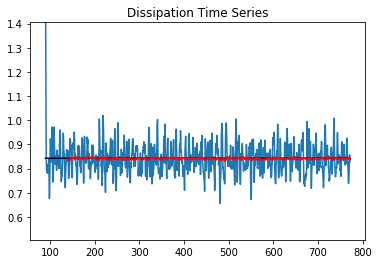

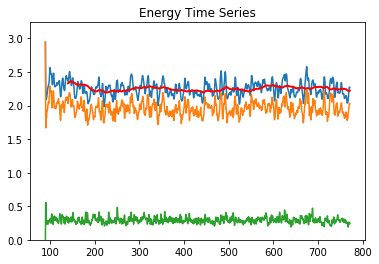

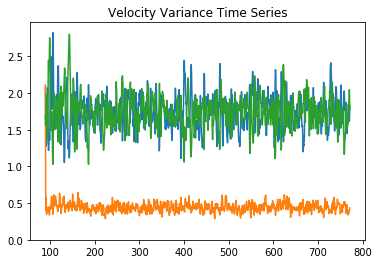

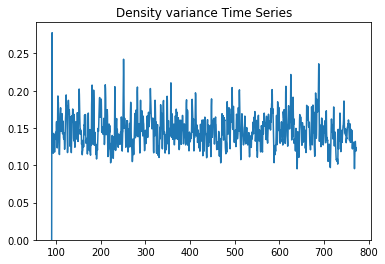

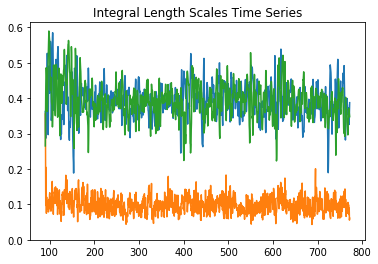

Dissipation is  0.8429366399714165
Reynolds number is  309.6639615421837 or  51.76119338469676
Froude number is  0.17550715703275446 or  1.0499804577890002
The Gibson number is  9.538505359917185 or  57.06459151725396


In [6]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N2-646464-Eps084'
bName = 'N2-646464-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.0065
Moving average of  100  pts out of  4296


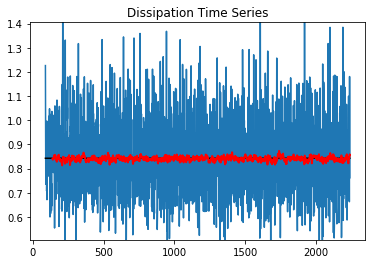

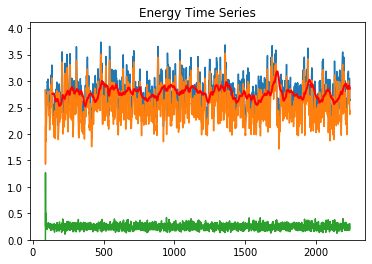

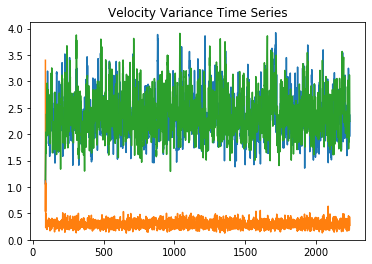

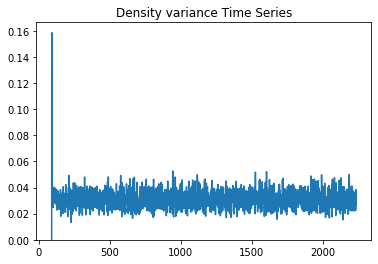

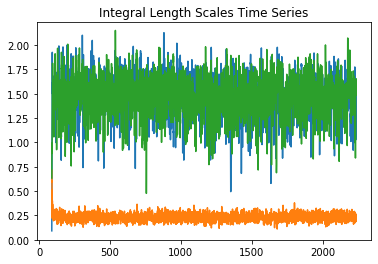

Dissipation is  0.8409085763920727
Reynolds number is  1538.1037844153304 or  287.69167256990386
Froude number is  0.059600218989478176 or  0.31864433739361836
The Gibson number is  5.463630888885101 or  29.2105477776759


In [4]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N4-12832-Eps084'
bName = 'N4-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.0065
Moving average of  100  pts out of  6565


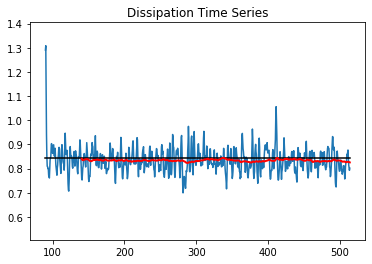

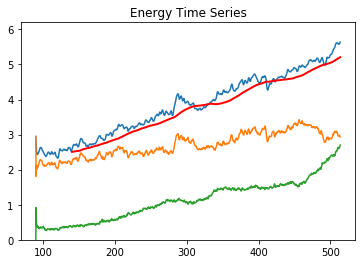

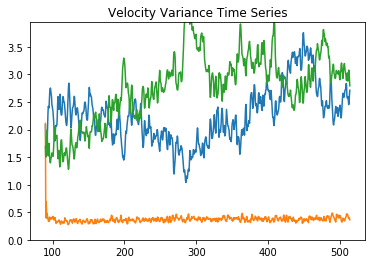

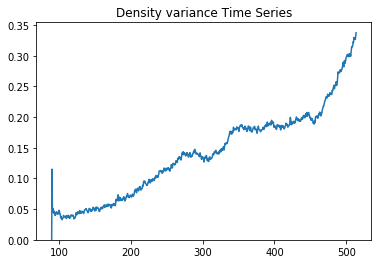

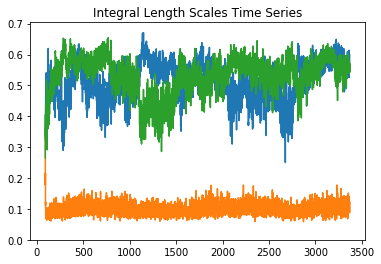

Dissipation is  0.8399979438069218
Reynolds number is  1647.0924429198328 or  177.26536271177594
Froude number is  0.059183465915051005 or  0.5499136321007188
The Gibson number is  5.7692421025318295 or  53.60593250191592


In [6]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N4-128128-Eps084'
bName = 'N4-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, endPt=850)

viscosity is  0.0065
Moving average of  100  pts out of  2424


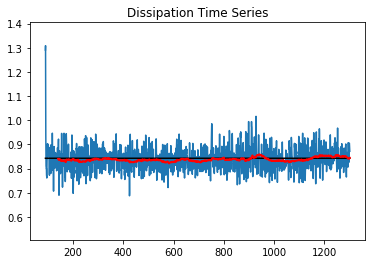

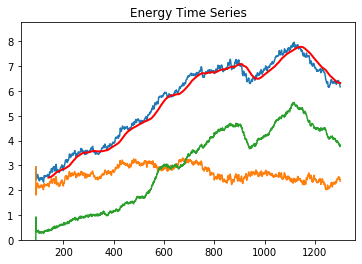

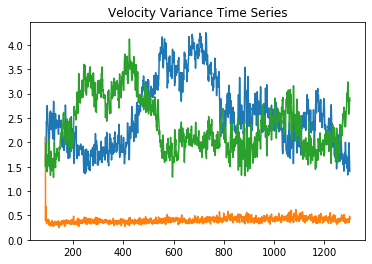

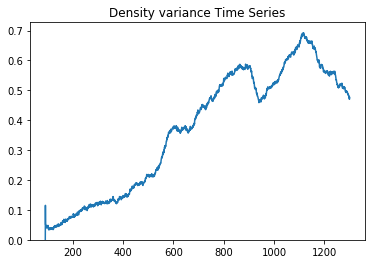

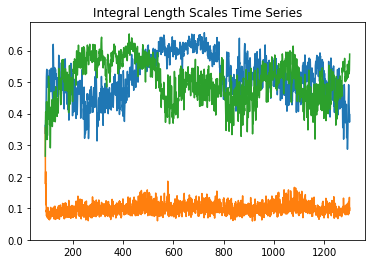

Dissipation is  0.8383617135110397
Reynolds number is  1544.6587121400644 or  172.36544329409676
Froude number is  0.0611071150993125 or  0.547613465367576
The Gibson number is  5.767878455843404 or  51.68903660220292


In [4]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/NewTests/'
bFold = 'N4-128128-Eps084'
bName = 'N4-128128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

['N4-12832-Eps084stats-old', 'N4-12832-Eps084stats', 'N4-12832-Eps084restart00618883.h5']
viscosity is  0.0065
Moving average of  100  pts out of  571


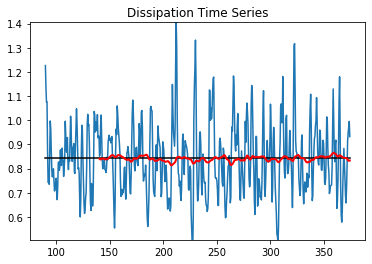

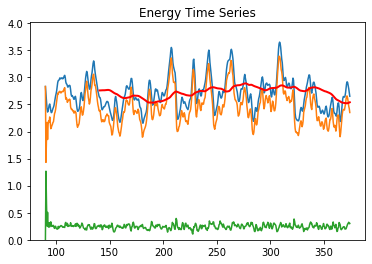

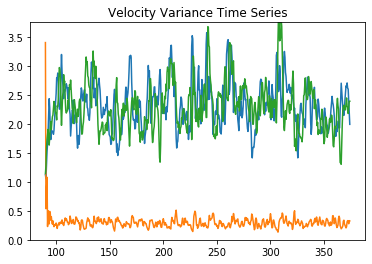

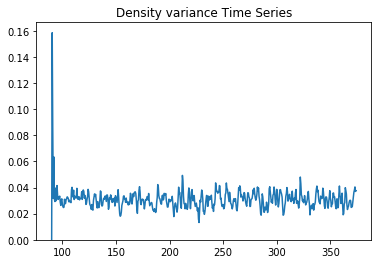

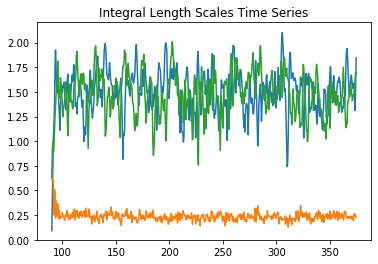

Dissipation is  0.8415702019970208
Reynolds number is  1435.8550726619146 or  284.9619988073286
Froude number is  0.06182724938576871 or  0.31153266060332724
The Gibson number is  5.488712188338927 or  27.656302492938032


In [9]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N4-12832-Eps084'
bName = 'N4-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

['N2-12832-Eps084stats-old', 'N2-12832-Eps084stats', 'N2-12832-Eps084restart00618883.h5']
viscosity is  0.0065
Moving average of  100  pts out of  560


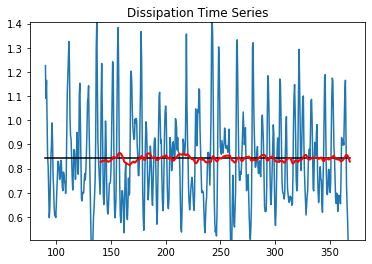

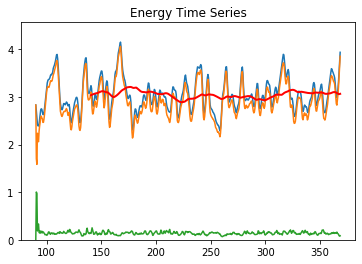

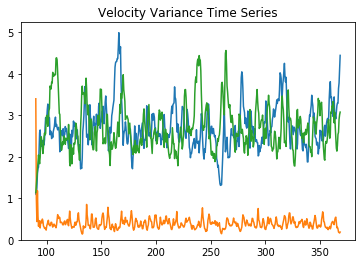

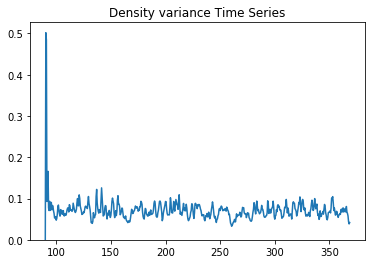

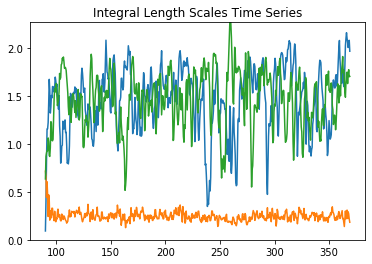

Dissipation is  0.8367322772181045
Reynolds number is  1721.86611823374 or  306.60890566099783
Froude number is  0.12118292883251995 or  0.6805437657305119
The Gibson number is  25.286124363814316 or  142.00279248129803


In [10]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N2-12832-Eps084'
bName = 'N2-12832-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

['N2-256256-Eps084stats-old', 'N2-256256-Eps084restart01116786.h5', 'N2-256256-Eps084stats']
viscosity is  0.00251215
Moving average of  100  pts out of  218


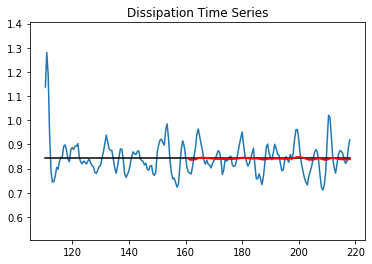

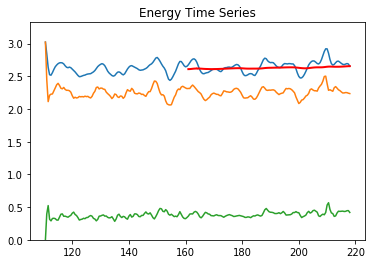

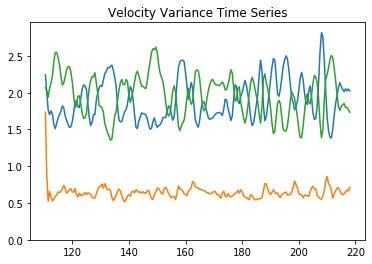

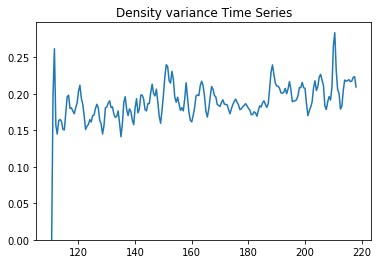

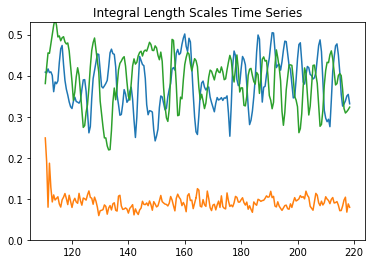

Dissipation is  0.8461408231551033
Reynolds number is  2625.5943961615094 or  344.8071266228872
Froude number is  0.14656141202817222 or  1.1160176005745714
The Gibson number is  56.39841745285033 or  429.4556503715613


In [11]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N2-256256-Eps084'
bName = 'N2-256256-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.00251215
Moving average of  100  pts out of  225


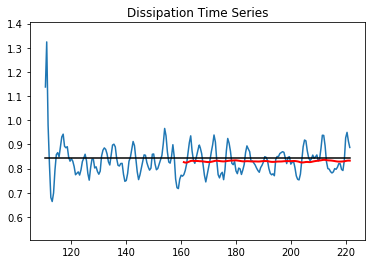

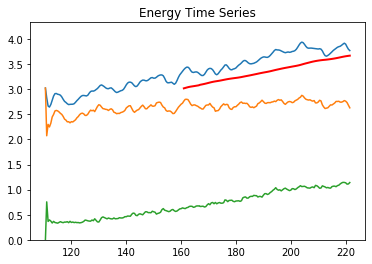

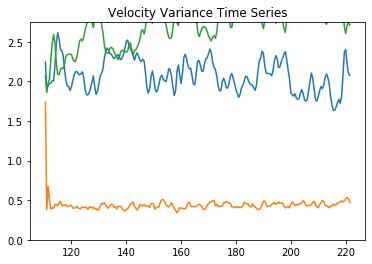

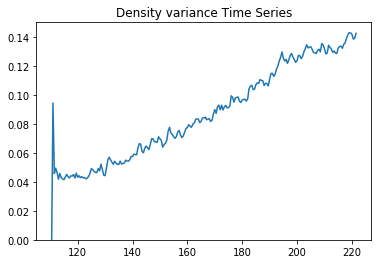

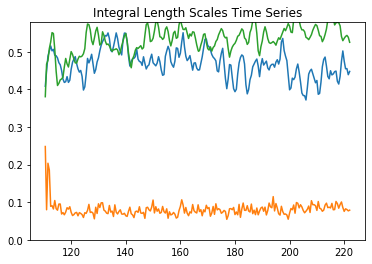

Dissipation is  0.8352569323991117
Reynolds number is  4056.725459665866 or  438.248905459694
Froude number is  0.05947563555823096 or  0.5505463265123302
The Gibson number is  14.350062774462913 or  132.83379440253066


In [21]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N4-256256-Eps084'
bName = 'N4-256256-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.00251215
Moving average of  100  pts out of  166


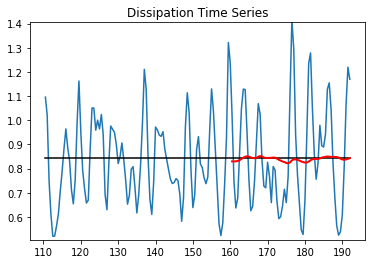

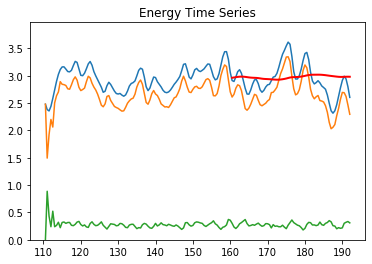

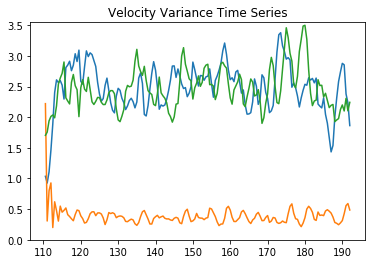

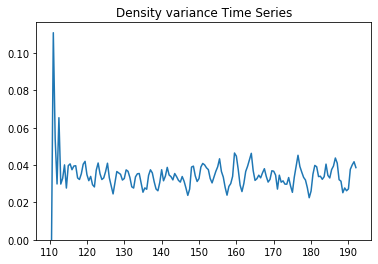

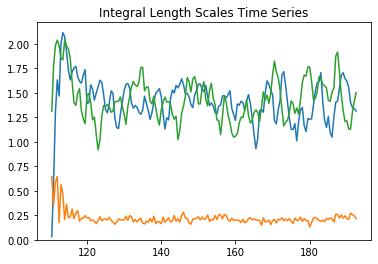

Dissipation is  0.8419272747664099
Reynolds number is  4399.2793769257805 or  747.1957105952109
Froude number is  0.05589594972297782 or  0.32909971963582724
The Gibson number is  13.74492017602099 or  80.92624597602685


In [22]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N4-25664-Eps084'
bName = 'N4-25664-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.00251215
Moving average of  100  pts out of  159


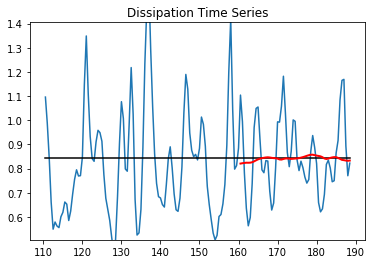

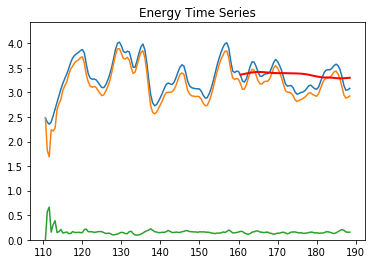

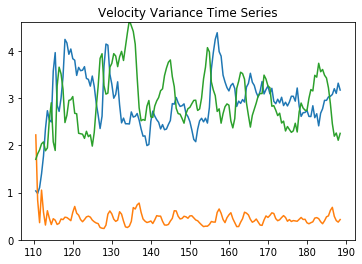

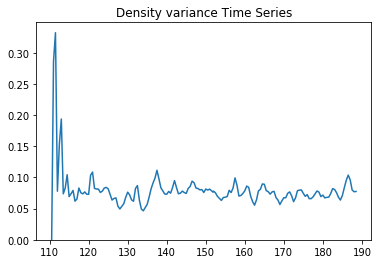

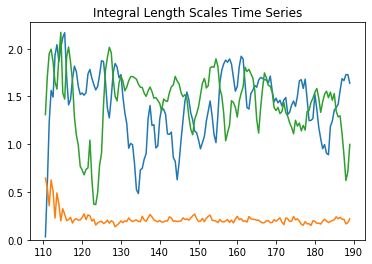

Dissipation is  0.8330586519334624
Reynolds number is  5368.748907689854 or  813.8713517500206
Froude number is  0.10884598350169464 or  0.7180087538093345
The Gibson number is  63.60597417705948 or  419.5804455475212


In [23]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N2-25664-Eps084'
bName = 'N2-25664-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  595


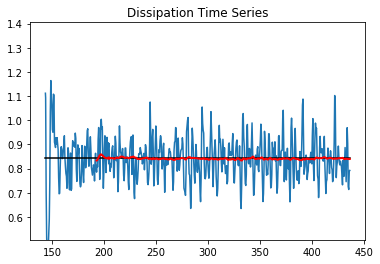

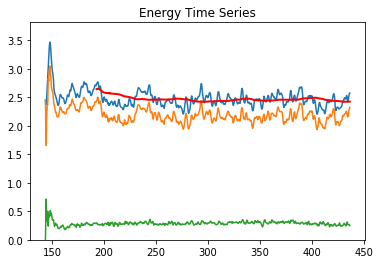

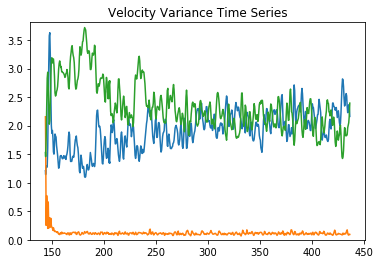

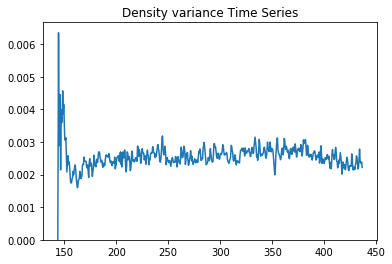

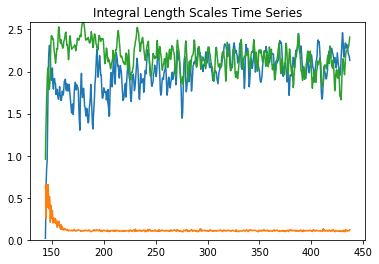

Dissipation is  0.8407370342630355
Reynolds number is  7217.555148768685 or  2109.9959893478717
Froude number is  0.019771375509640844 or  0.06763093097250453
The Gibson number is  2.821394920333919 or  9.651001014584667


In [14]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N15-512128-Eps084'
bName = 'N15-512128-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  250


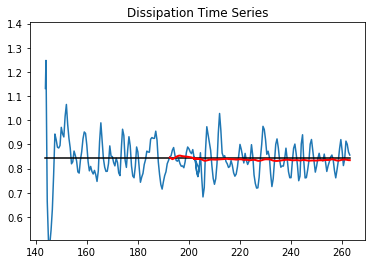

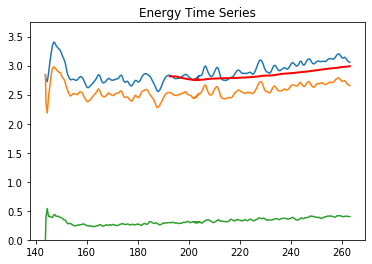

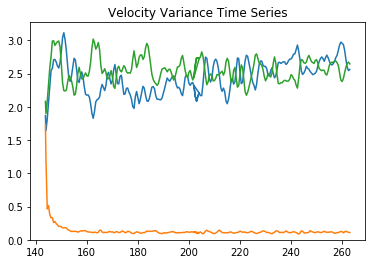

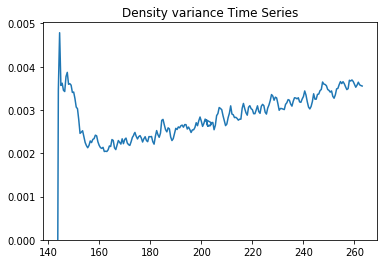

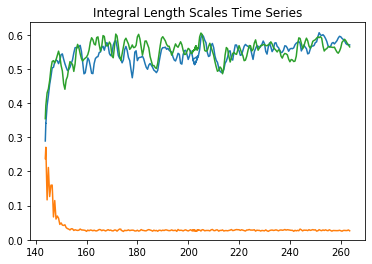

Dissipation is  0.8432696876364876
Reynolds number is  9875.106081058377 or  1170.023073136834
Froude number is  0.01688044385503442 or  0.14247255254283336
The Gibson number is  2.81390540206914 or  23.7496293752544


In [13]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalTests/'
bFold = 'N15-512512-Eps084'
bName = 'N15-512512-Eps084'
pltPowerInput = False

sData = []

processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100) #, endPt=125)

viscosity is  0.00099695
Moving average of  100  pts out of  704


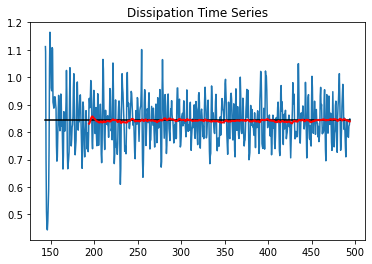

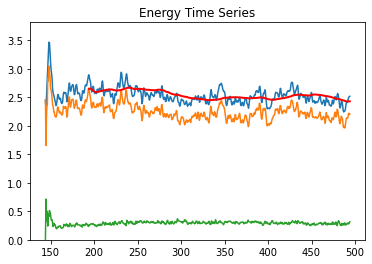

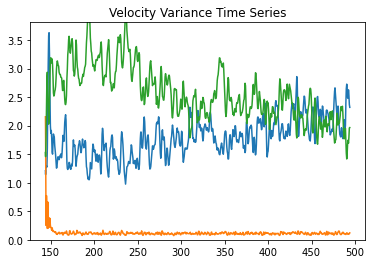

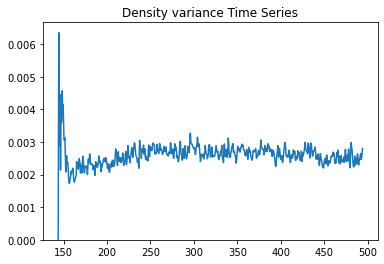

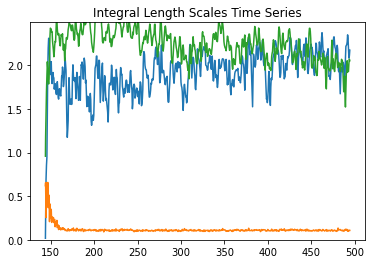

Dissipation is  0.8413232057766545
Reynolds number is  7573.77222766486 or  2136.150145561026
Froude number is  0.019291739112885772 or  0.06839932961648461
The Gibson number is  2.8187398833464843 or  9.993910722925353


In [60]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N15-512128-Eps084'
bName = 'N15-512128-Eps084'
pltPowerInput = False

sData = []

n15 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.00099695, bruVai=15, eps=0.84286) #, endPt=125)

viscosity is  0.00099695
Moving average of  100  pts out of  667


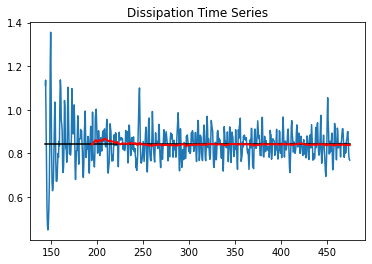

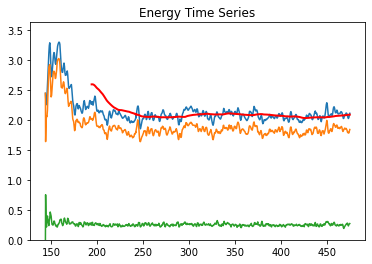

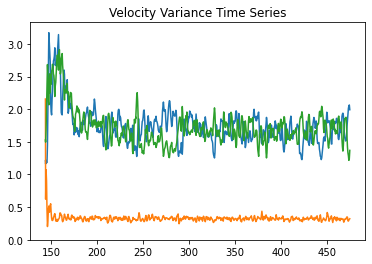

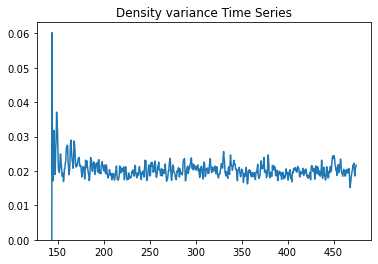

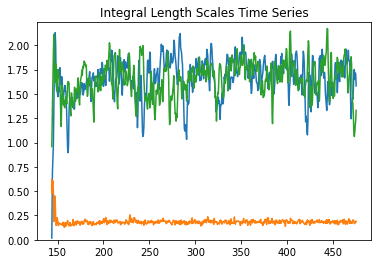

Dissipation is  0.84163090492484
Reynolds number is  5353.843942210302 or  1700.910764325128
Froude number is  0.06510092234384723 or  0.2049138532327417
The Gibson number is  22.690287108750788 or  71.42071102853991


In [59]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N5-512128-Eps084'
bName = 'N5-512128-Eps084'
pltPowerInput = False

sData = []

n5 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.00099695, bruVai=5, eps=0.84286) #, endPt=125)

viscosity is  0.00099695
Moving average of  100  pts out of  464


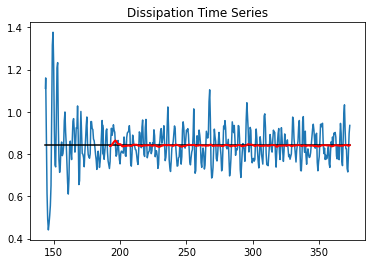

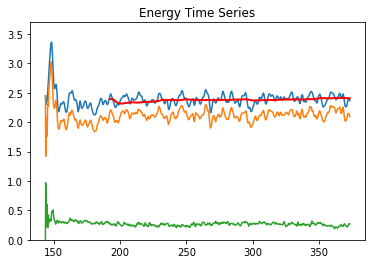

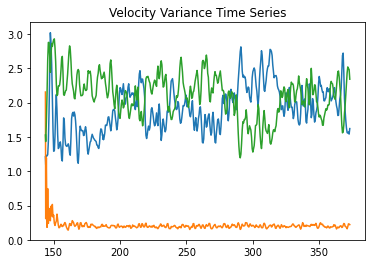

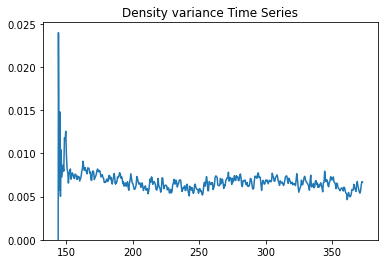

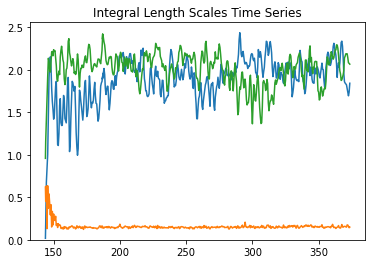

Dissipation is  0.8422741531418321
Reynolds number is  6651.775674531815 or  1983.6461932698314
Froude number is  0.033658770844272 or  0.11286820900631941
The Gibson number is  7.535882168571921 or  25.27013026068711


In [58]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N9-512128-Eps084'
bName = 'N9-512128-Eps084'
pltPowerInput = False

sData = []

n9 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.00099695, bruVai=9, eps=0.84286) #, endPt=125)

viscosity is  0.00099695
Moving average of  100  pts out of  385


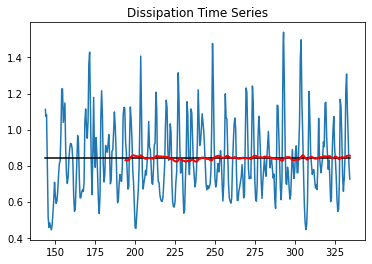

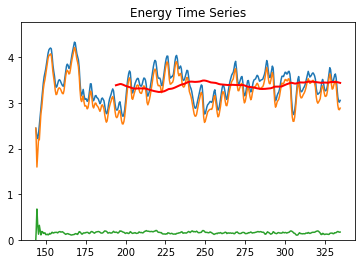

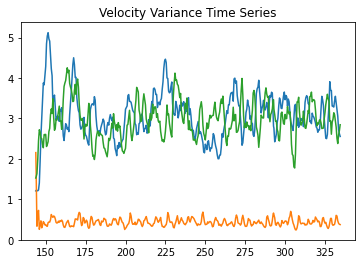

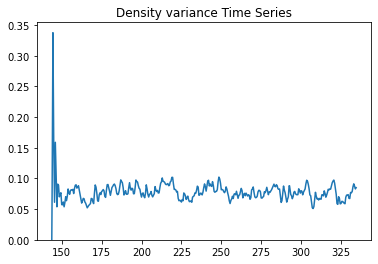

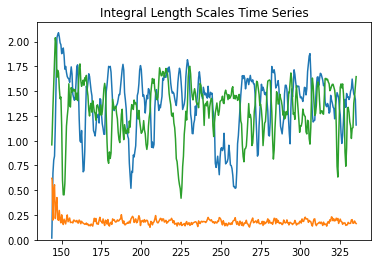

Dissipation is  0.8391033022051553
Reynolds number is  14050.238440230636 or  2020.7141033569585
Froude number is  0.1077266473769326 or  0.749034749397785
The Gibson number is  163.0534464049515 or  1133.7278225974956


In [57]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N2-512128-Eps084'
bName = 'N2-512128-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.00099695, bruVai=2, eps=0.84286) #, endPt=125)

In [58]:
summ=np.array([[n15[8],n15[3]/n15[2],n15[5]/n15[4]],[n9[8],n9[3]/n9[2],n9[5]/n9[4]],[n5[8],n5[3]/n5[2],n5[5]/n5[4]],[n2[8],n2[3]/n2[2],n2[5]/n2[4]]])

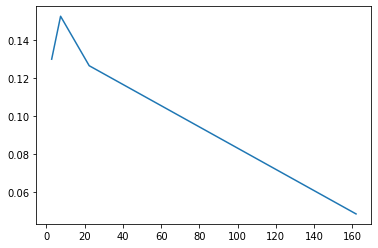

In [62]:
plt.plot(summ[:,0],summ[:,1])

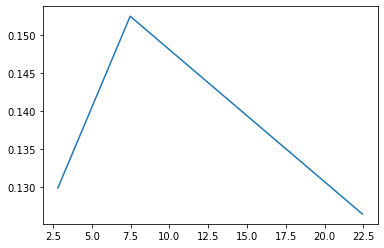

In [66]:
plt.plot(summ[0:3,0],summ[0:3,1])

viscosity is  0.0085
Moving average of  100  pts out of  532


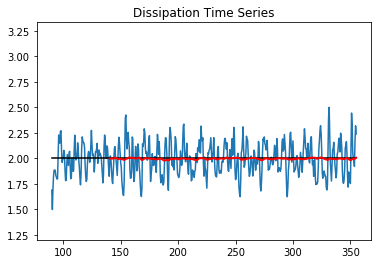

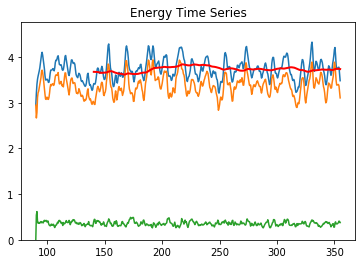

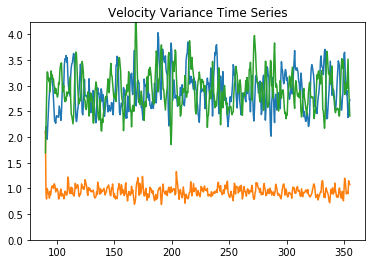

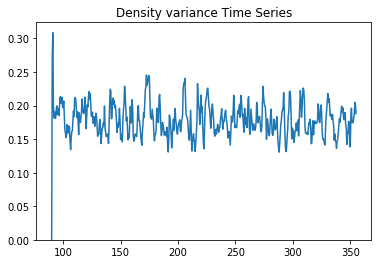

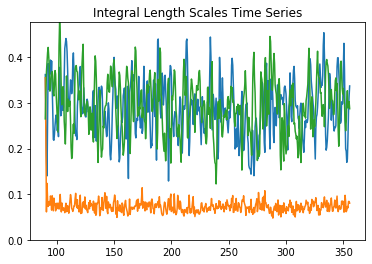

Dissipation is  1.9934425267294753
Reynolds number is  645.2499456209079 or  108.30117451643427
Froude number is  0.26456076648658683 or  1.5762323996125418
The Gibson number is  45.16259175442873 or  269.07519704896964


In [4]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N2-128128-Eps200'
bName = 'N2-128128-Eps200'
pltPowerInput = True

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.0085, bruVai=2, eps=2.00) #, endPt=125)

viscosity is  0.0085
Moving average of  100  pts out of  489


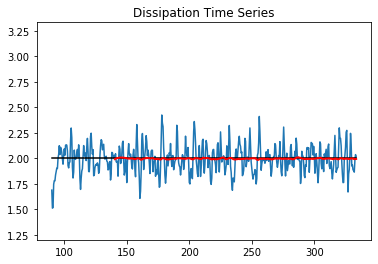

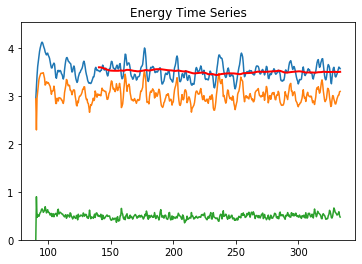

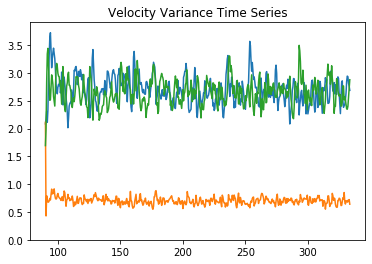

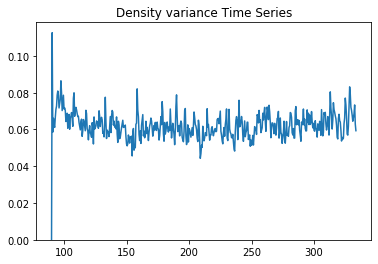

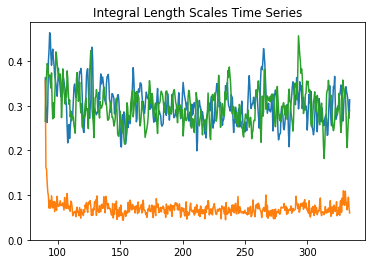

Dissipation is  1.9925771187043049
Reynolds number is  615.4991842108714 or  105.73260027030071
Froude number is  0.1280785429672957 or  0.7455811973767449
The Gibson number is  10.096718272991753 or  58.77583493025115


In [5]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N4-128128-Eps200'
bName = 'N4-128128-Eps200'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.0085, bruVai=4, eps=2.00) #, endPt=125)

viscosity is  0.0033545
/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns//N4-256256-Eps200/N4-256256-Eps200stats/diss.txt
Moving average of  100  pts out of  244


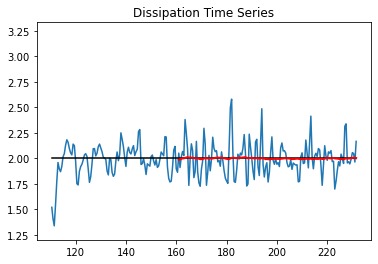

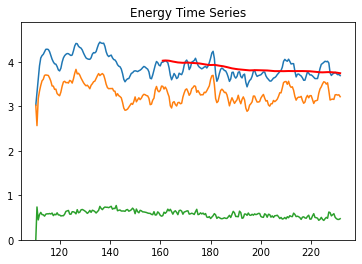

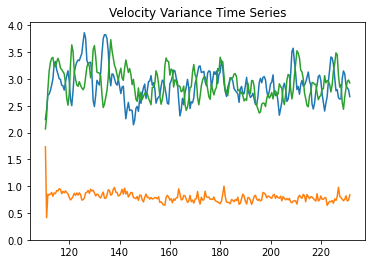

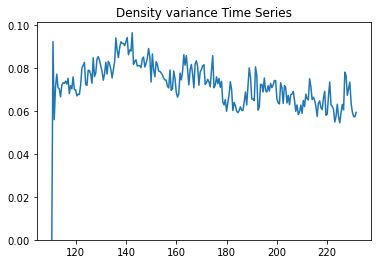

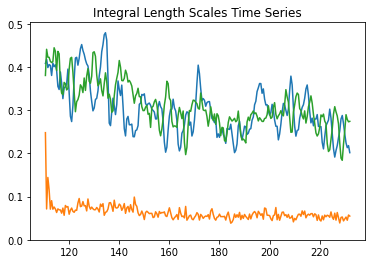

Dissipation is  1.9905833821797339
Reynolds number is  1887.4118666993281 or  281.48492184560115
Froude number is  0.11466766454303125 or  0.7688692856661341
The Gibson number is  24.816962002207404 or  166.40262032964216


In [37]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/finalRuns/'
bFold = 'N4-256256-Eps200'
bName = 'N4-256256-Eps200'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.0033545, bruVai=4, eps=2.00) #, endPt=125)

viscosity is  0.0065
/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/SMAG-N4128128-3232-Eps084/SMAG-N4128128-3232-Eps084stats/diss.txt
Moving average of  100  pts out of  1091


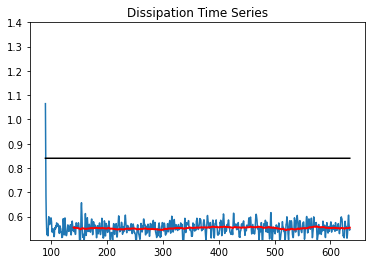

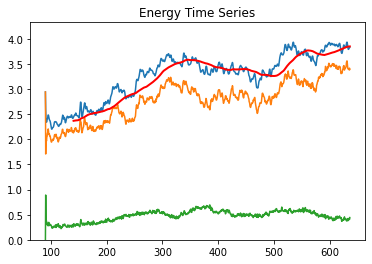

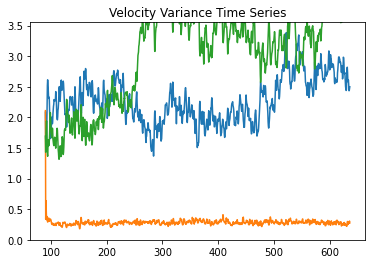

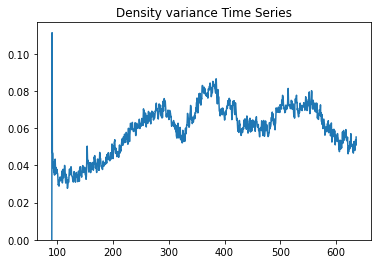

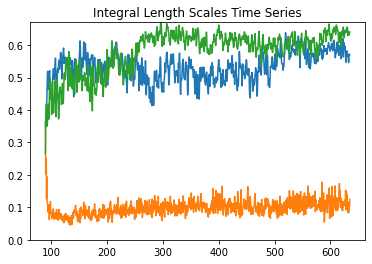

Dissipation is  0.553280821481968
Reynolds number is  2584.998348312443 or  186.63663258128204
Froude number is  0.03932350697273402 or  0.5446476351854461
The Gibson number is  3.997281694573033 or  55.36408600659222


In [36]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'SMAG-N4128128-3232-Eps084'
bName = 'SMAG-N4128128-3232-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=False, visc=0.0065, bruVai=4, eps=0.84) #, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  303


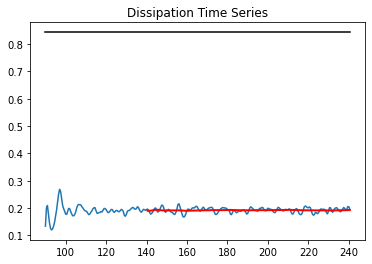

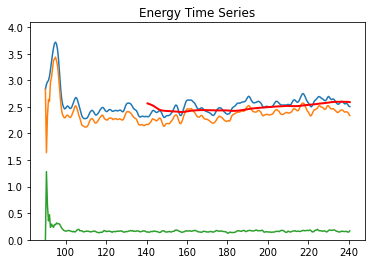

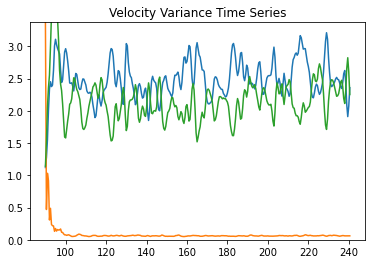

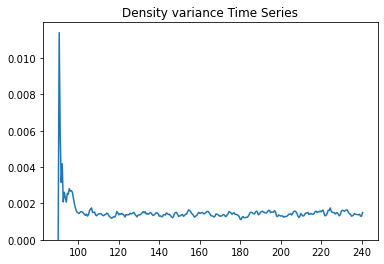

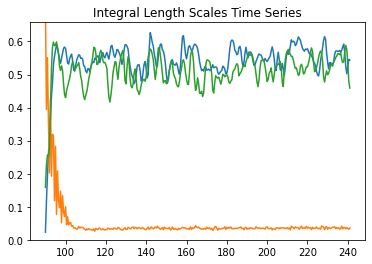

Dissipation is  0.19154252282462805
Reynolds number is  33426.346278294994 or  1109.5043102200675
Froude number is  0.00465310411538339 or  0.14018536746280366
The Gibson number is  0.7237264553750178 or  21.8039090838052


In [63]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'STAMD-N15-512128-12832-Eps084'
bName = 'STAMD-N15-512128-12832-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=True)#, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  87


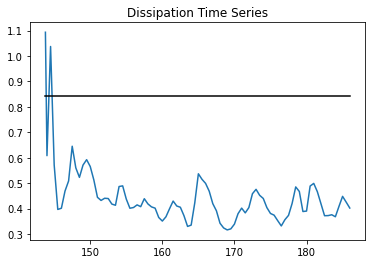

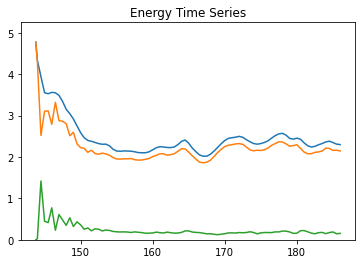

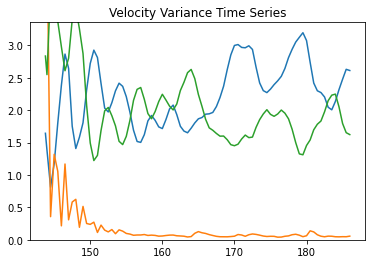

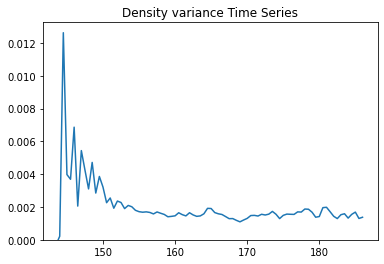

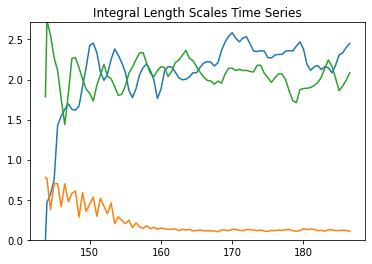

Dissipation is  0.44346042787090134
Reynolds number is  13278.018788942312 or  2108.5222013527964
Froude number is  0.010738820733156377 or  0.06762568749546476
The Gibson number is  1.5312512776541982 or  9.642764597043211


In [61]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS/LES/EXPMQM'
bFold = 'EXPMQM-N15-512128-12832-Eps084'
bName = 'EXPMQM-N15-512128-12832-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=True)#, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  263


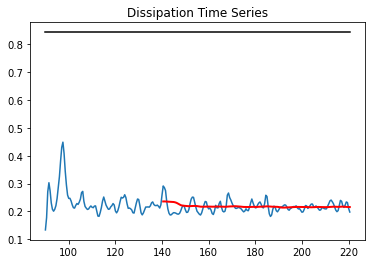

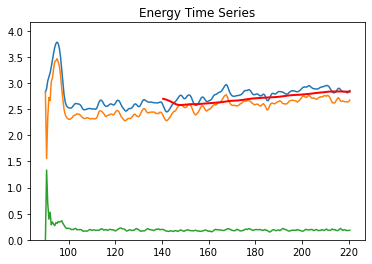

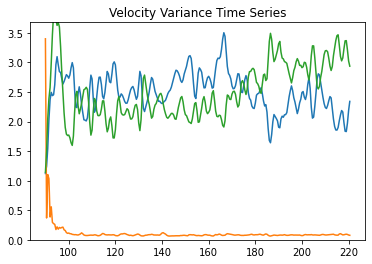

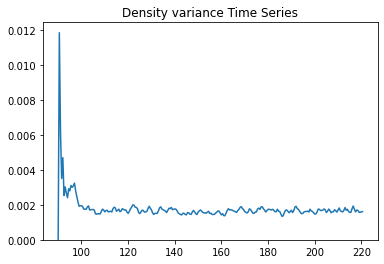

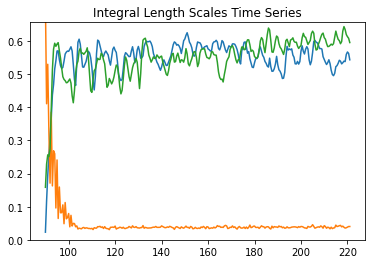

Dissipation is  0.2228250172856327
Reynolds number is  36311.580512081906 or  1175.1066981048568
Froude number is  0.004605627956481955 or  0.1423169748076501
The Gibson number is  0.7702343057180112 or  23.800753625481764


In [54]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'EXPQ-N15-512128-12832-Eps084'
bName = 'EXPQ-N15-512128-12832-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=True)#, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  263


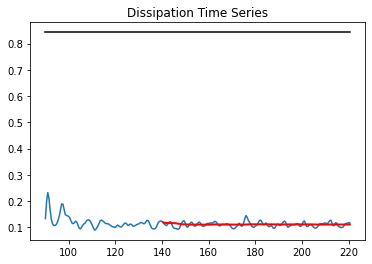

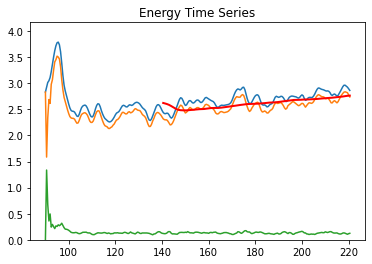

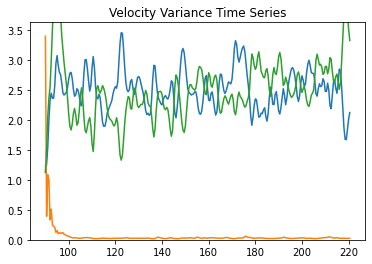

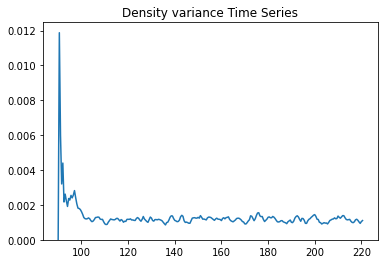

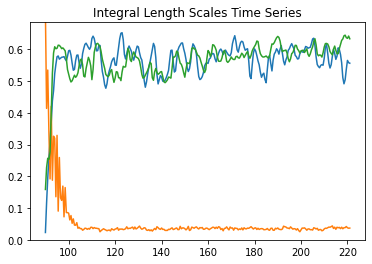

Dissipation is  0.1148323886769553
Reynolds number is  66446.8141710098 or  1190.6771692335187
Froude number is  0.002512402749948276 or  0.1402069032330678
The Gibson number is  0.41942342606816113 or  23.40630287625306


In [52]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'M43-N15-512128-12832-Eps084'
bName = 'M43-N15-512128-12832-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=True) #, endPt=125)

0.842863388758926
viscosity is  0.00099695
Moving average of  100  pts out of  267


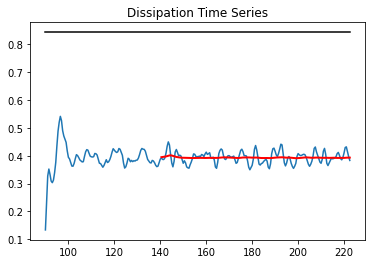

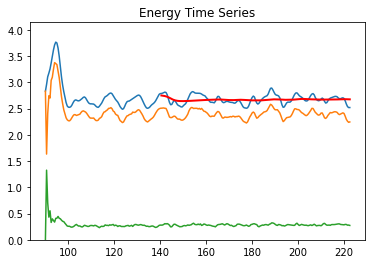

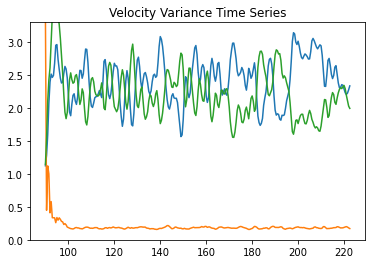

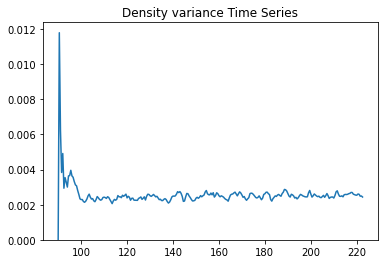

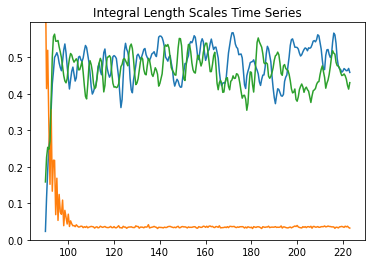

Dissipation is  0.39253335071316725
Reynolds number is  18098.952959061706 or  1046.3662017026797
Froude number is  0.008544959919989725 or  0.14780181869148923
The Gibson number is  1.3215193035223978 or  22.858264792979327


In [53]:
bPath = '/Users/blmindell/Desktop/Jeremy/WorkFromHome/stratDNS'
bFold = 'SMAG-N15-512128-12832-Eps084'
bName = 'SMAG-N15-512128-12832-Eps084'
pltPowerInput = False

sData = []

n2 = processPBSim(bPath, bFold, bName, pltPowerInput, sData, wind=100, h5File=True)#, endPt=125)

In [88]:
arr = np.array(np.resize(np.arange(64),[8,8]) + 1)

posSlice = np.matrix(arr[0:3, 0:3])
negSlice = np.matrix(arr[0:3, 6:8])

np.concatenate((posSlice, negSlice),axis=1)

matrix([[ 1,  2,  3,  7,  8],
        [ 9, 10, 11, 15, 16],
        [17, 18, 19, 23, 24]])

In [78]:
np.resize(np.arange(64),[8,8]) + 1

array([[ 1,  2,  3,  4,  5,  6,  7,  8],
       [ 9, 10, 11, 12, 13, 14, 15, 16],
       [17, 18, 19, 20, 21, 22, 23, 24],
       [25, 26, 27, 28, 29, 30, 31, 32],
       [33, 34, 35, 36, 37, 38, 39, 40],
       [41, 42, 43, 44, 45, 46, 47, 48],
       [49, 50, 51, 52, 53, 54, 55, 56],
       [57, 58, 59, 60, 61, 62, 63, 64]])

In [107]:
aa = np.array([[1, 2, 3, 4], [3, 4, 5, 6], [2, 6, 8, 3], [1, 7, 4, 7]])

a = aa[:, 0:2]
b = aa[:, 3:]

print (a)
print (b)

#print(np.concatenate((a, b), axis=0))

print(np.concatenate((a, b), axis=1))


[[1 2]
 [3 4]
 [2 6]
 [1 7]]
[[4]
 [6]
 [3]
 [7]]
[[1 2 4]
 [3 4 6]
 [2 6 3]
 [1 7 7]]


In [109]:
aa = np.array([[0.138621,-4.11126e-07,-0.138621],[-4.11126e-07,1.22672e-12,4.11126e-07],[-0.138621,4.11126e-07,0.138621]])

In [111]:
np.linalg.eig(aa)

(array([0.00000000e+00, 2.77242000e-01, 7.39112572e-15]),
 array([[-7.07106781e-01, -7.07106781e-01, -1.48291384e-06],
        [-2.09715687e-06,  2.09715687e-06, -1.00000000e+00],
        [-7.07106781e-01,  7.07106781e-01,  1.48291384e-06]]))